# Students

Leonardo Chiarioni  
A0001145863  
leonardo.chiarioni@studio.unibo.it  

Nicolas Cridlig  
A16002193  
nicolasivan.cridlig@studio.unibo.it  

Federico Marchi  
A0001118908  
federico.marchi9@studio.unibo.it  

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [78]:
# from google.colab import drive
# drive.mount('/content/drive')

# !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
# !unzip dataset.zip

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

### Imports

In [340]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import os
import math
from scipy.stats import pearsonr
import itertools
import pandas as pd

# Task A - Denoising
Since we observed that the performance of SIFT in detection tasks is **highly influenced** by the quality of denoising, we decided to dedicate some time to understanding how to achieve **high-quality denoising** for the given scenes, rather than relying on visual inspection or random attempts.

Among all the filters we studied, the **non-linear median** filter and the **bilateral filter** yielded the best results. Our objective is to **denoise the scenes effectively while preserving their features, avoiding excessive smoothing**. To achieve this, we experimented with various combinations of these two filters and tested different parameter configurations.

The process begins with applying the **median filter to remove impulse noise**, as the bilateral filter is not particularly effective against this type of noise. Once the impulse noise is reduced, we apply the **bilateral filter for further denoising while preserving edges and fine details**.

But which parameters should be used? To answer this question, we conducted a preliminary study to determine the optimal parameters for these two filters. Since the noise distribution may vary across images and the number of pixels in each image differs (factors that could significantly impact the performance of the median and bilateral filters, particularly parameters such as **sigmaColor**, **sigmaSpace**, **d**, and the **size of the median filter**), we decided to compute an **average of the best parameters** for each scene in task A.

To obtain an approximate estimate of the quality of our denoising, and since we don't have any ground truth of the scenes without noise, and only images without noise are the models, we will compare the model image with the perspective-warped version ROI of the object detected in the noisy scene, using two different metrics that will be explained later.

In order to get the first detections, at least one for each scene, we manually adjusted the parameters to visually denoise the scenes (evaluation by naked eye), ensuring that the scenes were denoised enough for SIFT to detect at least one object in each scene.

Detecting at least one object per scene is crucial, as one of the key factors used to evaluate the quality of denoising is the number and the quality of keypoints/descriptors detected in the ROI of the perspective-warped object in the denoised image. We also assess how many of these keypoints match those in the model. This analysis helps us understand how well the keypoints are detected and described, despite the smoothing introduced by the filters.

### **Evaluation Metrics**
Two metrics have been considered:

1)   The first metric considered consists of the **ratio of keypoints matched between the model and the ROI** from the denoised scene, to the total number of keypoints detected in the model image.

&nbsp;

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$ \mathbf{{\% KPs} = \frac{\text{\# Matched KPs}}{{\text{\# Model KPs}}} \cdot 100 }$

&nbsp;

2)   The second metric considered is the **Euclidean distance between the matched descriptors**. Even though the descriptors are filtered, we aim to minimize the number of incorrect matches and identify parameters that denoise the image in a way that produces high-quality descriptors, closely resembling those of the model.

&nbsp;

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$ \mathbf{\|\mathbf{d}_1 - \mathbf{d}_2 \|} $

&nbsp;

This allows to understand which are the best parameters (**on average**) for **non-linear median** filter and the **bilateral** one.

### **Final Score**

After **z-score normalizing** both the percentage of matched keypoints and the Euclidean distance, and **inverting the Euclidean distance** values (since we aim for the maximum value for the final score), we can now **combine them to obtain the final score**. This score will serve as the key metric to assess the quality of denoising. 

The Euclidean distance will be weighted slightly more than the percentage of matched keypoints, as we prioritize accuracy in matching over quantity. Essentially, it represents a trade-off between the number of matched keypoints and the similarity of their respective descriptors.

&nbsp;

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $ \mathbf{\text{Final Score} = w_1 \cdot \left( \frac{\|\mathbf{d}_1 - \mathbf{d}_2 \| - \mu_{\text{distance}}}{\sigma_{\text{distance}}} \right) + w_2 \cdot \left( \frac{\left( \frac{\# \text{Matched KPs}}{{\# \text{Model KPs}}} \cdot 100 \right) - \mu_{\text{match}}}{\sigma_{\text{match}}} \right)} $

with $w_1 = 0.6$ and $w_2 = 0.4$.

&nbsp;


### 1) Denoising by naked eye

We first need to reach a good denoising to detect at least one model for each scene. 



In [212]:
def load_RGB_images(dir_path, img_name, num):
    '''
    Function for extraction of images from a specified directory,
    it returns a list of RGB images.
    
    Arguments:
    - dir_path: str, path of the directory.
    - num: int, the first num images to extract.
    - img_name: str, name of the image. 
    '''
    imgs = []
    img_names = [f"{img_name}{i}.png" for i in range(1, num+1)]
    
    for img_name in img_names:
        img = cv2.imread(dir_path+img_name)
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs.append(rgb_img)
    return imgs

In [213]:
scenes_path = 'dataset/scenes/'
models_path = 'dataset/models/'
scene_name = 'scene'
model_name = 'ref'

task_A_scenes = load_RGB_images(scenes_path, scene_name, 5)
task_A_models = load_RGB_images(models_path, model_name, 14)

We then need to denoise the task A scenes by neked eye. Since in the scenes there is salt and pepper noise and gaussian noise, we will use as filters the **medianBlur** for sault and pepper noise, and **bilateralFilter** for smoothing while preserving edges.

In [214]:
task_A_scenes_denoised_naked_eye = []

for scene in task_A_scenes:
    median_denoised_scene = cv2.medianBlur(scene, 5)
    denoised_scene = cv2.bilateralFilter(median_denoised_scene, 35, 50, 50)
    task_A_scenes_denoised_naked_eye.append(denoised_scene)

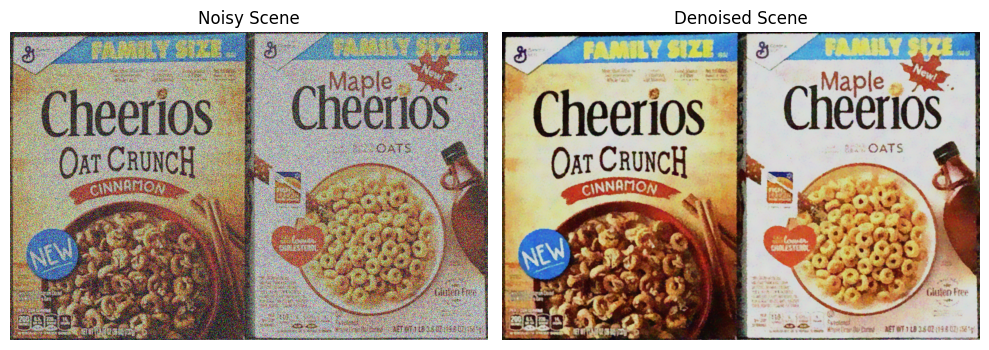

In [215]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(task_A_scenes[0], cmap='gray')
plt.title("Noisy Scene")
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(task_A_scenes_denoised_naked_eye[0], cmap='gray')
plt.title("Denoised Scene")
plt.axis('off')

plt.tight_layout()
plt.show()

### 2) Detection

At this point we select 1 object for each scene, and use SIFT to detect it and compute the homography matrix. In this way we will have 5 pairs model - ROI that will be used to tune the parameters of the filters. The models that will be considered are:
-   **ref1** in **scene1**
-   **ref4** in **scene2**
-   **ref8** in **scene3**
-   **ref9** in **scene4**
-   **ref11** in **scene5**

In [59]:
model_idxs = [1, 4, 8, 9, 11] 
models_for_tuning = []

for idx in model_idxs:
    models_for_tuning.append(task_A_models[idx-1])    

We need now to define the detection algorithm. **SIFT** will be used for Keypoints detection and their description.  

**FLANN** library will be use to perform efficiently the **nearest neighbor KNN** search of the two closest keypoints in the scene, for each keypoint of the model. 

Then to filter out ambiguous matches and keep only those where the best match is significantly better than the second-best match, the default **threshold 0.7** will be used.

In [64]:
def flann_knn_standard(model_des, scene_des):
    """
    Performs K-Nearest Neighbors (KNN) matching using the FLANN-based matcher.

    Args:
        model_des: Feature descriptors from the model image.
        scene_des: Feature descriptors from the scene image.

    Returns:
        list: A list of matches where each match contains the two nearest neighbors 
              for a descriptor in the model image. Each match is a tuple (m, n).
    """
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(model_des,scene_des,k=2)

    return matches

def remove_ambiguous_matches(matches, threshold=0.7):
    '''
    Filters out ambiguous matches.

    Arguments:
    - matches: list of matched descriptors.
    - threshold: the threshold used for filtering. 
    '''
    good_matches = []
    for m, n in matches:
        if m.distance < threshold*n.distance:
            good_matches.append(m)
    return good_matches

Since the number of keypoints changes from model to model, we will use a **dynamic threshold**. A model is considered detected if and only if **x%** of the number of keypoints of the model are matched. 

In [65]:
def is_detected(num_kp, num_matches, threshold):
    '''
    Checks if detection is valid based on the number of keypoints, matches, and a threshold.
    Moreover there must be at least 4 matches in order to compute the homography matrix.

    Parameters:
        num_kp: Total keypoints detected.
        num_matches: Matches found.
        threshold: Minimum proportion of keypoints required as matches.

    Returns:
        bool: True if matches exceed the threshold, False otherwise.
    '''
    
    MIN_MATCH_COUNT = math.ceil(num_kp * threshold)
    
    return num_matches >= 4 and num_matches > MIN_MATCH_COUNT

def get_homography(model_kp, scene_kp, matches):
    '''
    Computes the homography matrix using keypoint matches between a model and a scene.

    Parameters:
        model_kp: Keypoints from the model image.
        scene_kp: Keypoints from the scene image.
        matches: Matches between model and scene keypoints.

    Returns:
        np.ndarray: The homography matrix mapping model points to scene points.
    '''
    src_pts = np.float32([ model_kp[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ scene_kp[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,10.0)  
    return M

Models and scenes are now organized in the lists **models_for_tuning** and **task_A_scenes_denoised_naked_eye**, respectively. Using SIFT and the functions defined earlier, we will extract the homography matrices that capture the mapping between each model and scene.

In [66]:
sift = cv2.SIFT_create()
# List of homography matrices for mapping between each pair model - scene 
Ms = []
for i, (model, scene) in enumerate(zip(models_for_tuning, task_A_scenes_denoised_naked_eye)):
    model_kps, model_des = sift.detectAndCompute(model, None)
    scene_kps, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = remove_ambiguous_matches(matches)
    if is_detected(len(model_kps), len(filtered_matches), 0.02): # 2% of kps must be matched to consider the model detected in the scene
        Ms.append(get_homography(model_kps, scene_kps, filtered_matches))
    else:
        print(f"Missed detection for ref{model_idxs[i]}.png in scene{i}.png")

We then need a function that, given the model, the scene, and the homography matrix of the detected model, returns the ROI with its perspective warped to match the model.

In [342]:
def get_ROI_perspective_warped(model, scene, M):
    """
    Warps the scene image into the perspective of the model image using the given 
    homography matrix and extracts the ROI.

    Args:
        model: The reference or model image.
        scene: The scene image to be warped.
        M: The homography matrix that transforms the scene to the model's perspective.

    Returns:
        roi: The ROI extracted from the warped scene image, aligned with the model's perspective.
    """
    roi = cv2.warpPerspective(scene, np.linalg.inv(M), (model.shape[1], model.shape[0]))
    return roi

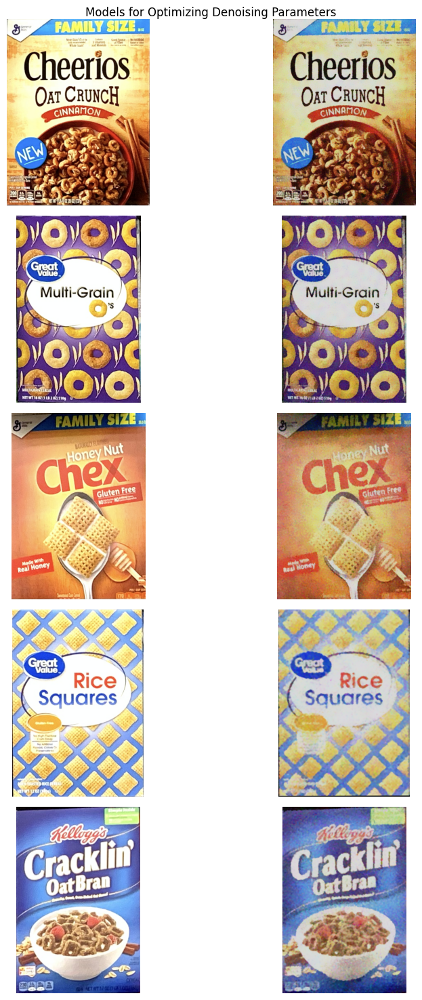

In [67]:
fig, axes = plt.subplots(len(models_for_tuning), 2, figsize=(10, len(models_for_tuning) * 3))
fig.suptitle('Models for Optimization of Denoising Parameters')
for i, (model, scene) in enumerate(zip(models_for_tuning, task_A_scenes_denoised_naked_eye)):
    
    roi = get_ROI_perspective_warped(model, scene, Ms[i])
    
    axes[i, 0].imshow(model)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(roi)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

### 3) Tuning **medianBlur** parameters

Different Kernels sizes and number of iterations of the same filter are applied to the noisy scene. Then, as explained above, the **percentage of KPs matched** are computed for each combination.

In [216]:
def compute_average_descriptor_distance(good_matches, des_model, des_roi):
    """
    Compute the average Euclidean distance between matched descriptors.

    Args:
        good_matches: List of good matches (filtered, e.g., from FLANN or BFMatcher).
        des_model: Descriptors from the model image.
        des_roi: Descriptors from the ROI image.

    Returns:
        float: The average Euclidean distance between the matched descriptors.
    """
    # List to store distances between matched descriptors
    descriptor_distances = []

    # Iterate over each match and compute the descriptor distance
    for match in good_matches:
        # Get the descriptor of the matched keypoints from both model and ROI
        descriptor_model = des_model[match.queryIdx]
        descriptor_roi = des_roi[match.trainIdx]
        
        # Compute Euclidean distance between the descriptors
        distance = np.linalg.norm(descriptor_model - descriptor_roi)
        descriptor_distances.append(distance)
    
    # Compute the average distance
    if descriptor_distances:
        average_distance = np.mean(descriptor_distances)
    else:
        average_distance = float('inf')  # Return infinity if no good matches

    return average_distance

In [291]:
kernel = [3, 5, 7, 9, 11]
iterations = [1, 2, 4, 6, 8, 10]
colors = ['magenta', 'green', 'blue', 'purple', 'grey']
sift = cv2.SIFT_create()

des_dists = []
pers = []

for iter in iterations:
    model_des_dists = []
    model_pers = []
    for i, model in enumerate(models_for_tuning):
        kp_model, des_model = sift.detectAndCompute(model, None)
        img = task_A_scenes[i]
        kernel_des_dists = []
        kernel_pers = []
        
        for val in kernel:
            for _ in range(iter):
                img = cv2.medianBlur(img, val)
            roi = get_ROI_perspective_warped(model, img, Ms[i])
            _, des_roi = sift.detectAndCompute(roi, None)
            matches = remove_ambiguous_matches(flann_knn_standard(des_model, des_roi))
            kernel_des_dists.append(compute_average_descriptor_distance(matches, des_model, des_roi))
            kernel_pers.append(len(matches)*100/len(kp_model))
            img = task_A_scenes[i]
    
        model_des_dists.append(kernel_des_dists)
        model_pers.append(kernel_pers)

    des_dists.append(model_des_dists)
    pers.append(model_pers)

In [292]:
def normalize_z_score(data):
    """
    Normalize the given data using Z-score normalization (standardization).
    
    Args:
        data (numpy.ndarray or list): The input data to normalize (can be a list or numpy array).
    
    Returns:
        numpy.ndarray: The normalized data (Z-scores).
    """
    # Convert to numpy array if it's not already
    data = np.array(data)
    
    # Calculate mean and standard deviation
    mean = np.mean(data)
    std_dev = np.std(data)
    
    # Apply Z-score normalization (if std_dev is not zero)
    if std_dev == 0:
        raise ValueError("Standard deviation is zero, cannot normalize the data.")
    
    normalized_data = (data - mean) / std_dev
    
    return normalized_data.tolist()

In [293]:
flattened_des_dists = [item for sub1 in des_dists for sub2 in sub1 for item in sub2]
flattened_pers = [item for sub1 in pers for sub2 in sub1 for item in sub2]

# Z-score normalization
normalized_fattened_des_dists = normalize_z_score(flattened_des_dists)
# Invert values since we want to maximize the function value, in this way best result when distance is lower
normalized_fattened_des_dists = [-1 * item for item in normalized_fattened_des_dists]

normalized_flattened_pers = normalize_z_score(flattened_pers)
weig_des_dists_pers = [0.6 * x + 0.4 * y for x, y in zip(normalized_fattened_des_dists, normalized_flattened_pers)]

# Recreating sublists structure
weig_des_dists_pers = [weig_des_dists_pers[i:i + len(kernel)] for i in range(0, len(weig_des_dists_pers), len(kernel))]
normalized_des_dists = [normalized_fattened_des_dists[i:i + len(kernel)] for i in range(0, len(normalized_fattened_des_dists), len(kernel))]
normalized_pers = [normalized_flattened_pers[i:i + len(kernel)] for i in range(0, len(normalized_flattened_pers), len(kernel))]

weig_des_dists_pers = [weig_des_dists_pers[i:i + len(models_for_tuning)] for i in range(0, len(weig_des_dists_pers), len(models_for_tuning))]
normalized_des_dists = [normalized_des_dists[i:i + len(models_for_tuning)] for i in range(0, len(normalized_des_dists), len(models_for_tuning))]
normalized_pers = [normalized_pers[i:i + len(models_for_tuning)] for i in range(0, len(normalized_pers), len(models_for_tuning))]

We coompute the **mean** value of the inverse of the Euclidean distance and of the percentage of matched KPs for each kernel size, within every iteration. The same is done for the final score funciton.

In [294]:
means_des_dists = []
means_per = []
means_weig = []

for i in range(len(iterations)):
    mean_per = []
    mean_des_dist = []
    mean_weig = []
    
    for j in range(len(kernel)):
        sum_per = 0
        sum_des_dist = 0
        sum_weig = 0    
        
        for z in range(len(models_for_tuning)):
            sum_per += normalized_pers[i][z][j]
            sum_des_dist += normalized_des_dists[i][z][j]
            sum_weig += weig_des_dists_pers[i][z][j]
        
        mean_per.append(sum_per/len(models_for_tuning))
        mean_des_dist.append(sum_des_dist/len(models_for_tuning))
        mean_weig.append(sum_weig/len(models_for_tuning))
    
    means_per.append(mean_per)
    means_des_dists.append(mean_des_dist)

    means_weig.append(mean_weig)

#### Plot results


*******************************************************
******************** 1 ITERATIONS ********************


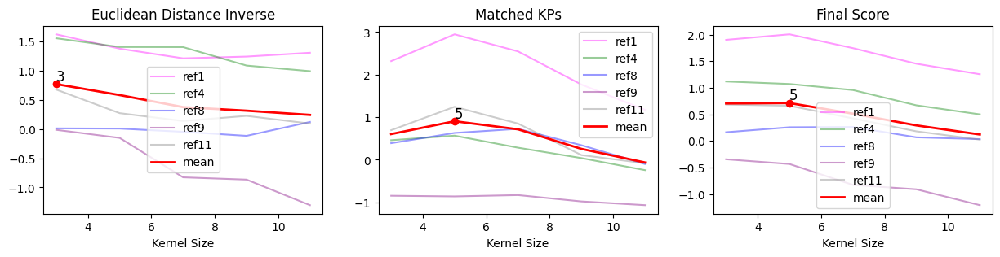

Best result with 1 iterations:
Kernel size: 5  |  Euc. Dist.: 0.58  |  %Kpts: 0.91  |  Func: 0.71

*******************************************************
******************** 2 ITERATIONS ********************


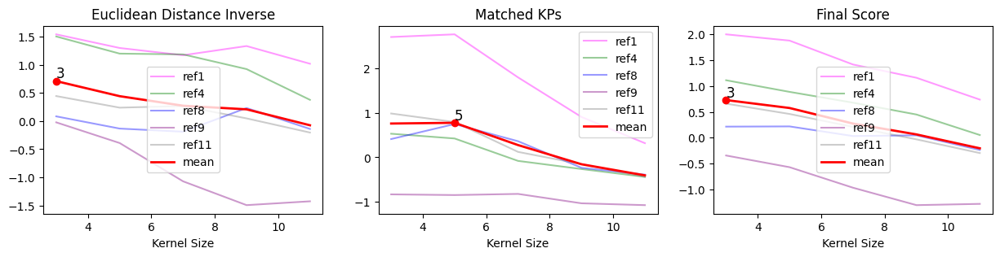

Best result with 2 iterations:
Kernel size: 3  |  Euc. Dist.: 0.71  |  %Kpts: 0.76  |  Func: 0.73

*******************************************************
******************** 4 ITERATIONS ********************


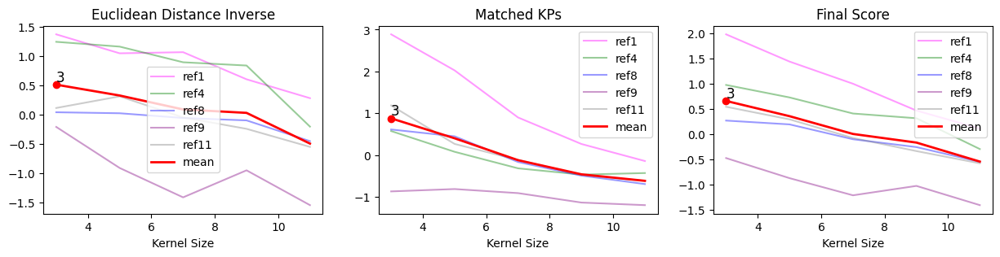

Best result with 4 iterations:
Kernel size: 3  |  Euc. Dist.: 0.51  |  %Kpts: 0.88  |  Func: 0.66

*******************************************************
******************** 6 ITERATIONS ********************


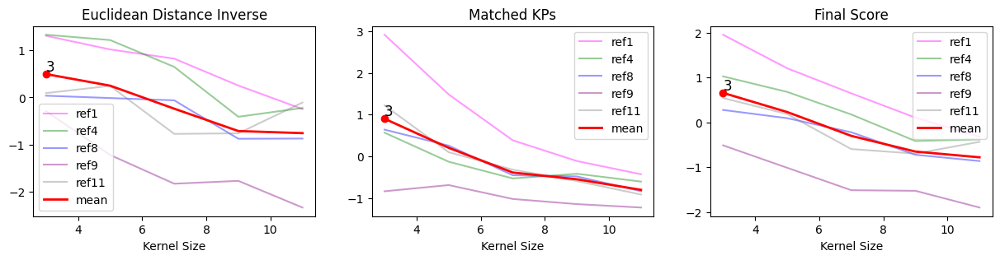

Best result with 6 iterations:
Kernel size: 3  |  Euc. Dist.: 0.5  |  %Kpts: 0.9  |  Func: 0.66

*******************************************************
******************** 8 ITERATIONS ********************


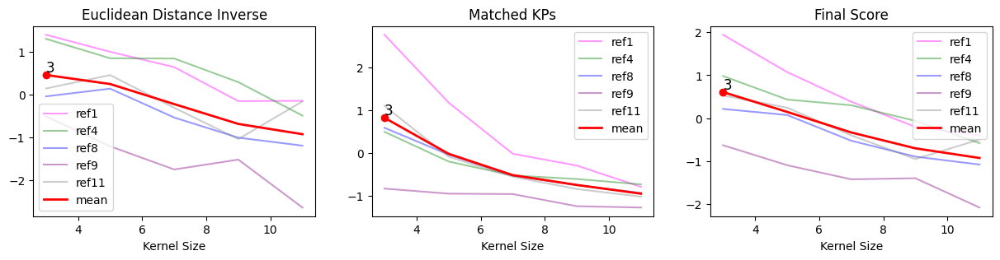

Best result with 8 iterations:
Kernel size: 3  |  Euc. Dist.: 0.46  |  %Kpts: 0.83  |  Func: 0.61

*******************************************************
******************** 10 ITERATIONS ********************


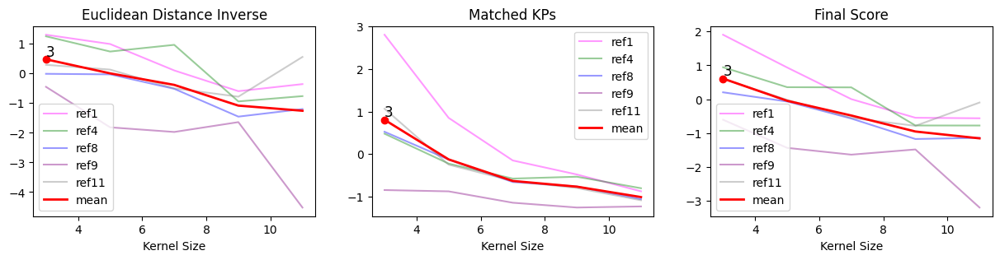

Best result with 10 iterations:
Kernel size: 3  |  Euc. Dist.: 0.48  |  %Kpts: 0.81  |  Func: 0.61



In [295]:
peaks_vals_weig = []
peaks_vals_des_dist = []
peaks_vals_pers = []

for i, iter in enumerate(iterations):
        print('*******************************************************')
        print(f'******************** {iter} ITERATIONS ********************')
        
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
        
        for j in range(len(models_for_tuning)):
            ax1.plot(kernel, normalized_des_dists[i][j], label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)
            ax2.plot(kernel, normalized_pers[i][j], label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)
            ax3.plot(kernel, weig_des_dists_pers[i][j],
                     label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)        
        
        peak_idx_des_dist = means_des_dists[i].index(max(means_des_dists[i]))
        x_peak_des_dist = kernel[peak_idx_des_dist]
        y_peak_des_dist = means_des_dists[i][peak_idx_des_dist]
        
        peak_idx_per = means_per[i].index(max(means_per[i]))
        x_peak_per = kernel[peak_idx_per]
        y_peak_per = means_per[i][peak_idx_per]
        
        peak_idx_final = means_weig[i].index(max(means_weig[i]))
        x_peak_final = kernel[peak_idx_final]
        y_peak_final = means_weig[i][peak_idx_final]
        
        
        peaks_vals_weig.append((y_peak_final, x_peak_final))
        peaks_vals_des_dist.append((y_peak_des_dist, peak_idx_des_dist))
        peaks_vals_pers.append((y_peak_per, x_peak_per))
        
        ax1.plot(x_peak_des_dist, y_peak_des_dist, 'ro')
        ax1.text(x_peak_des_dist, y_peak_des_dist, f'{x_peak_des_dist}', fontsize=12, verticalalignment='bottom')
        ax1.plot(kernel, means_des_dists[i], color='red', label='mean', linewidth=2)
        ax1.set_title('Euclidean Distance Inverse')
        ax1.legend()
        
        ax2.plot(x_peak_per, y_peak_per, 'ro')
        ax2.text(x_peak_per, y_peak_per, f'{x_peak_per}', fontsize=12, verticalalignment='bottom')
        ax2.plot(kernel, means_per[i], color='red', label='mean', linewidth=2)
        ax2.set_title('Matched KPs')
        ax2.legend()
        
        ax3.plot(x_peak_final, y_peak_final, 'ro')
        ax3.text(x_peak_final, y_peak_final, f'{x_peak_final}', fontsize=12, verticalalignment='bottom')
        ax3.plot(kernel, means_weig[i], color='red', label='mean', linewidth=2)
        ax3.set_title('Final Score')
        ax3.legend()
        
        ax1.set_xlabel('Kernel Size')
        ax2.set_xlabel('Kernel Size')
        ax3.set_xlabel('Kernel Size')
        plt.show()
        
        best_res_idx = means_weig[i].index(max(means_weig[i]))
        print(f'Best result with {iter} iterations:')
        print(f'Kernel size: {kernel[best_res_idx]}  |  Euc. Dist.: {round(means_des_dists[i][best_res_idx],2)}  |  %Kpts: {round(means_per[i][best_res_idx],2)}  |  Func: {round(means_weig[i][best_res_idx],2)}')
        print('')

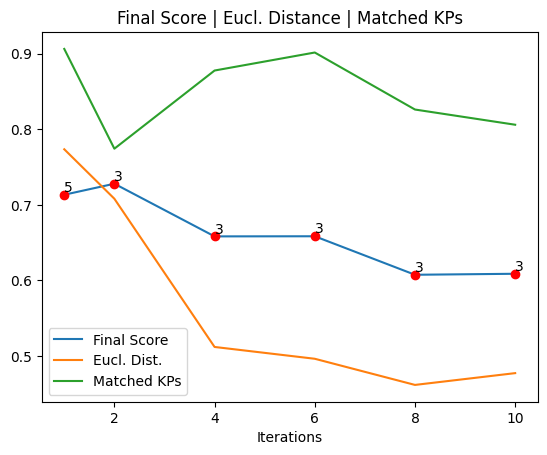

****************************************************************************************
****************************************************************************************
Iterations: 1  |  Kernel size: 5  |  Magnitude of function: 0.713
----------------------------------------------------------------------------------------
Iterations: 2  |  Kernel size: 3  |  Magnitude of function: 0.728
----------------------------------------------------------------------------------------
Iterations: 4  |  Kernel size: 3  |  Magnitude of function: 0.658
----------------------------------------------------------------------------------------
Iterations: 6  |  Kernel size: 3  |  Magnitude of function: 0.658
----------------------------------------------------------------------------------------
Iterations: 8  |  Kernel size: 3  |  Magnitude of function: 0.608
----------------------------------------------------------------------------------------
Iterations: 10  |  Kernel size: 3  |  Magnitude

In [296]:
plt.plot(iterations, [y for (y, _) in peaks_vals_weig], label='Final Score')
plt.plot(iterations, [y for (y, _) in peaks_vals_des_dist], label='Eucl. Dist.')
plt.plot(iterations, [y for (y, _) in peaks_vals_pers], label='Matched KPs')
plt.title('Final Score | Eucl. Distance | Matched KPs')

for i, peak in enumerate(peaks_vals_weig):
    plt.plot(iterations[i], peak[0], 'ro')
    plt.text(iterations[i], peak[0], f'{round(peak[1], 2)}', fontsize=10, verticalalignment='bottom')
    
plt.legend()
plt.xlabel('Iterations')
plt.show()

print('****************************************************************************************')
print('****************************************************************************************')
for i, iter in enumerate(iterations):   
    print(f'Iterations: {iter}  |  Kernel size: {peaks_vals_weig[i][1]}  |  Magnitude of function: {round(peaks_vals_weig[i][0],3)}')
    print('----------------------------------------------------------------------------------------')    
print('****************************************************************************************')
print('****************************************************************************************')

It seems that the best combination is achieved with just **two iterations** using a **kernel of size 3**. The number of matched keypoints remains fairly steady across different iterations; however, the precision of the descriptors appears to degrade as the number of iterations increases.

Next, we need to apply the same process to the bilateral filter. The Bilateral filter will be applied to the scenes already filtered with medianBlur filter.

### 4) Tuning **bilateralFilter** parameters

In [298]:
task_A_scenes_medianBlur = []
for scene in task_A_scenes:
    # 2 iterations with kernel of size 3
    task_A_scenes_medianBlur.append(cv2.medianBlur(cv2.medianBlur(scene, 3),3))

In this case, since there are more parameters with respect to the mediaBlur filter, we will implement a grid search with some possible combinations of these parameters: **d**, **sigmaColor**, and **sigmaSpace**. Moreover, we will also try using more **iterations**.

In [341]:
param_grid = {
    'd' : list(range(20, 70, 10)),
    'sigmaColor' : list(range(15, 35, 5)),
    'sigmaSpace' : list(range(15, 35, 5)),
    'iterations' : [1, 2, 3]
}

param_names = list(param_grid.keys())
# All possible combinations
combinations = list(itertools.product(*param_grid.values()))

des_dists = []
pers = []
    
for i, model in enumerate(models_for_tuning):
    kp_model, des_model = sift.detectAndCompute(model, None)

    for combination in combinations:
        params = dict(zip(param_names, combination))
        scene = task_A_scenes_medianBlur[i]
        for _ in range(params['iterations']):
            scene = cv2.bilateralFilter(scene, params['d'], params['sigmaColor'], params['sigmaSpace'])
        roi = get_ROI_perspective_warped(model, scene, Ms[i])
        _, des_roi = sift.detectAndCompute(roi, None)
        matches = remove_ambiguous_matches(flann_knn_standard(des_model, des_roi))
        des_dists.append(compute_average_descriptor_distance(matches, des_model, des_roi))
        pers.append(len(matches)*100/len(kp_model))

Results are **z-score normalized** and then the Euclidean Distance values are **inverted**.

In [343]:
normalized_pers = normalize_z_score(pers)
normalized_des_dists = normalize_z_score(des_dists)
inv_normalized_des_dists = [item * -1 for item in normalized_des_dists]

In [344]:
# Collect values into a structured vocabulary for clarity and easier implementation in code
results = {key: {'Distance': [], 'Percentage': []} for key in combinations}
for i in range(len(models_for_tuning)):
    for j, comb in enumerate(combinations):
        idx = i * len(combinations) + j
        results[comb]['Distance'].append(normalized_pers[idx])
        results[comb]['Percentage'].append(inv_normalized_des_dists[idx])

In [345]:
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: #006400' if v else '' for v in is_max]

In [346]:
flattened_result = []
# Average on every model result for each combination + flattening into a list
for i, key in enumerate(combinations):
    des_dist_mean = np.mean(results[key]['Distance'])
    per_mean = np.mean(results[key]['Percentage'])
    weig_mean = np.mean(0.6 * des_dist_mean + 0.4 * per_mean)
    flattened_result.append([combinations[i][0], combinations[i][1], combinations[i][2], combinations[i][3], des_dist_mean, per_mean, weig_mean])

# Print results as Data Frame
df = pd.DataFrame(flattened_result, columns = param_names + ['Distance'] + ['Percentage'] + ['Final Score'])
styled_df = df.style.apply(highlight_max, subset = ['Distance', 'Percentage', 'Final Score'])
styled_df

,d,sigmaColor,sigmaSpace,iterations,Distance,Percentage,Final Score
0,20,15,15,1,-0.143164,-0.207928,-0.169070
1,20,15,15,2,-0.133192,-0.107981,-0.123108
2,20,15,15,3,-0.067635,-0.140525,-0.096791
3,20,15,20,1,-0.181497,-0.068265,-0.136204
4,20,15,20,2,-0.128679,-0.173294,-0.146525
5,20,15,20,3,-0.092062,-0.137266,-0.110144
6,20,15,25,1,-0.171031,-0.123681,-0.152091
7,20,15,25,2,-0.145819,-0.084332,-0.121224
8,20,15,25,3,-0.126620,-0.069453,-0.103754
9,20,15,30,1,-0.180504,-0.112708,-0.153386


The best results is achieved with **3 iterations** and the following parameters:
-   **d** = 50	
-   **sigmaColor** = 25
-   **sigmaSpace** = 30	

In [347]:
task_A_scenes_denoised = []
for scene in task_A_scenes_medianBlur:  
    task_A_scenes_denoised.append(cv2.bilateralFilter(cv2.bilateralFilter(cv2.bilateralFilter(scene, 50, 25, 30), 50, 25, 30), 50, 25, 30))

# Task A - Detection

As we did during denoising, SIFT will be used for detecting each model in each scene. However, it is possible that SIFT detects the model in the scene incorrectly. To address this, we decided to use **Template Matching** to filter out wrong detections. Instead of sliding the template over the scene image, we extract the ROI from the scene, warp its perspective, and use **Zero-mean Normalized Cross-Correlation** as similarity function, since it is invariant to affine intensity changes.

This approach, however, is insufficient since **occluded objects would be rejected**. To prevent this, we decided to split both the model and the ROI into **multiple patches** and count how many of them have a similarity coefficient high enough to be considered detected.

Beyond the SIFT dynamic threshold explained in the denoising process, two additional thresholds are required:

-   **Similarity coefficient threshold**
-   **Number of patches**

We first need to define some functions to compute the **centroid** of the object detected in the scene, the function which computes and **draws the bounding box**, the **height** and **width** of the object in the scene.

In [349]:
def centroid_of_polygon(corners):
    '''
    Calculate the centroid of a polygon given its corners.

    Parameters:
    corners: A list of (x, y) coordinate pairs representing the vertices of the polygon.

    Returns:
    tuple: A tuple (centroid_x, centroid_y) representing the coordinates of the centroid, rounded to three decimal places.
    '''
    num_points = len(corners)
    x_sum = 0
    y_sum = 0

    for x, y in corners:
        x_sum += x
        y_sum += y

    centroid_x = x_sum / num_points
    centroid_y = y_sum / num_points
    
    return (round(float(centroid_x), 3), round(float(centroid_y), 3))

In [356]:
def draw_bounding_box(model, scene, M):
    """
    Draw a bounding box around a transformed model within a scene and calculate its centroid, height, and width.

    Parameters:
    model: The model image (grayscale or colored) whose corners will be transformed.
    scene: The scene image where the bounding box will be drawn.
    M: The 3x3 homography matrix used to map the model's corners into the scene.

    Returns:
    tuple: A tuple containing:
        - scene_with_bounding_box: The scene image with the bounding box and centroid drawn.
        - centroid_position: The (x, y) coordinates of the centroid of the bounding box.
        - height: The height of the bounding box.
        - width: The width of the bounding box.
    """
    # Handle both: grey scale and colored images
    if len(model.shape) == 3:
        h,w, _ = model.shape
    else: 
        h,w = model.shape
        
    model_corners = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(model_corners,M)
    
    scene_with_bounding_box = cv2.polylines(scene.copy(),[np.int32(trans_corners)],True,(0, 255, 0),10, cv2.LINE_AA)
    
    # Height and Width of boundinx_box
    min_x = np.min(trans_corners[:, :, 0])
    max_x = np.max(trans_corners[:, :, 0])
    min_y = np.min(trans_corners[:, :, 1])
    max_y = np.max(trans_corners[:, :, 1])
    height = max_y - min_y
    width = max_x - min_x
    
    # Centroid
    centroid_position = centroid_of_polygon(trans_corners.reshape(-1, 2))
    cv2.circle(scene_with_bounding_box, tuple(map(int, centroid_position)), radius=5, color=(0,255,0), thickness=10)
    
    return scene_with_bounding_box, centroid_position, height, width

In [354]:
def divide_image_into_patches(image, n):
    """
    Divides an image into a grid of n x n patches. If the image is not divisible by n,
    the patches on the rightmost and bottom edges will be larger to cover the remaining pixels.
    
    Parameters:
        image (numpy.ndarray): The input image.
        n (int): The number of divisions along each axis.
    
    Returns:
        list: A list of patches (as numpy arrays).
    """
    h, w = image.shape[:2]
    patch_w = w // n
    patch_h = h // n
    
    patches = []
    
    for i in range(n):
        from_h = i * patch_h
        to_h = h if i == n - 1 else (i + 1) * patch_h  # Last patch covers the remaining height
        for j in range(n):
            from_w = j * patch_w
            to_w = w if j == n - 1 else (j + 1) * patch_w  # Last patch covers the remaining width
            patch = image[from_h:to_h, from_w:to_w]
            patches.append(patch)
    
    return patches

In [359]:
def SIFT_templatematching_patch(model, scene, sift_th, tmpl_th, n, patch_th):
    '''
    Detects the presence of a model in a scene using SIFT feature matching and template matching on patches.
    The function computes keypoints and descriptors for the model and scene, checks for sufficient matches 
    to compute a homography matrix, then uses template matching on divided patches (to handle occlusion) 
    to validate the detection.

    Parameters:
        model:      The image of the model being detected.
        scene:      The image of the scene where the model might be detected.
        sift_th:    The threshold for the number of matches required for detection based on SIFT feature matching.
        tmpl_th:    The similarity coefficient threshold for template matching on patches.
        n:          The model and the region of interest (ROI) will be divided in a grid of nxn patches.
        patch_th:   The threshold for the proportion of patches that must match for the object to be considered detected.

    Returns:
        tuple or None: 
            - If the model is detected, returns a tuple (boundingbox_scene, centroid_position, height, width) 
              containing the bounding box, centroid position, and the dimensions of the detected object.
            - If the model is not detected, returns None.
    '''
    # Compute model and scens kps and descriptors
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = remove_ambiguous_matches(matches)
    
    # Check if the object is detected and if there are enough matches to compute the homography matrix
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        roi = get_ROI_perspective_warped(model, scene, M)
        
        # Double check: divides model and ROI in many patches and checks if at least half are matched
        roi_patches = divide_image_into_patches(roi, n)
        model_patches = divide_image_into_patches(model, n)
        valid_patches = 0
       
        for i, patch in enumerate(model_patches):  
            coeff = cv2.matchTemplate(patch, roi_patches[i], cv2.TM_CCOEFF_NORMED)[0][0]
            if coeff > tmpl_th:
                valid_patches += 1
                
        # If enough patches are matched the object is considered detected        
        if valid_patches >= patch_th:
            return (boundingbox_scene, centroid_position, height, width) 
        else:
            return None

In [708]:
def plot_result(model, boundingboxes, centroids, heights, widths, model_num, scenes_num):
    '''
    Plots the detection results of a model in multiple scenes and prints relevant information.

    Parameters:
        model: The image of the model being detected.
        boundingboxes: A list of bounding box images where the model was detected in different scenes.
        centroids: A list of (x, y) coordinates representing the centroids of the detected bounding boxes.
        heights: Heights of the detected bounding boxes.
        widths: Widths of the detected bounding boxes.
        model_num: The index of the model being processed.
        scenes_num: Indices of the scenes where the model was detected. 
        
    Returns:
        None
    '''
    
    print('###################################################################################################')
    print(f'###################################### Detection of model: {model_num+1} ######################################')
    # Check if gray image and plot model
    if len(model.shape)==3:
        plt.imshow(model)
    else:
        plt.imshow(model, cmap='gray')
    plt.title(f'Model {model_num+1}')
    plt.axis('off')
    plt.show()
    
    if len(boundingboxes) > 0:
        print('************************************************************************')
        if len(boundingboxes) == 1:
            print('************************************************************************')
            print(f'In scene {scenes_num[0]+1}:')
            print('    Position: ', centroids[0])
            print('    Height: ', heights[0])
            print('    Width: ', widths[0])
            print('************************************************************************')
            print('************************************************************************')
            plt.imshow(boundingboxes[0])
            plt.title(f'Scene {scenes_num[0]+1}')
            plt.axis('off')
            plt.show()
        else:
            if len(boundingboxes) == 2:
                rows = 1
                cols = 2
            else:
                rows = math.ceil(math.sqrt(len(boundingboxes)))
                cols = math.ceil(len(boundingboxes) / rows)
                
            fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
        
            fig.suptitle(f'Scenes', fontsize=14)
                
            for i in range(1, cols):
                axes.flat[i].axis('off')    
                
            for i in range(rows):
                for j in range(cols):
                    scene_idx = i * cols + j
                    ax_idx = i * cols + j
                    if scene_idx < len(boundingboxes):
                        # Check if gray image
                        if len(model.shape) == 3:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx])
                        else:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx], cmap='gray')
                        axes.flat[ax_idx].set_title(f'Scene {scenes_num[scene_idx]+1}')
                        axes.flat[ax_idx].axis('off')
                        print('************************************************************************')
                        print(f'Found in the scene {scenes_num[scene_idx]+1}:')
                        print('    Position: ', centroids[scene_idx])
                        print('    Height: ', heights[scene_idx])
                        print('    Width: ', widths[scene_idx])
                    else:
                        axes.flat[ax_idx].axis('off')
            #plt.tight_layout()
            print('************************************************************************')
            print('************************************************************************')
            plt.show()
            
    else:
        print('************************************************************************')
        print('Model not found!')
        print('************************************************************************')

We obtained perfect detections by searching for every model in every scene using the following thresholds:

-   **SIFT Threshold**: At least **2%** of the model's keypoints must be found in the scene.
-   **Template Matching Threshold**: The similarity coefficient (ZNCC) must be at least **0.5**.
-   **Number of Matched Patches**: Out of **64 patches (8x8)**, at least **32 (half)** must be matched with a similarity value equal to or above 0.5.

###################################################################################################
###################################### Detection of model: 1 ######################################


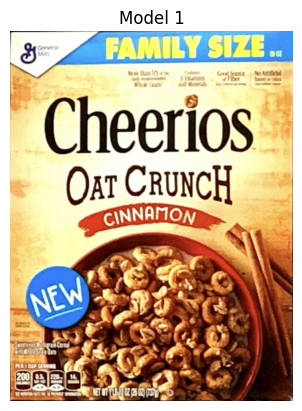

************************************************************************
************************************************************************
Found in the scene 1:
    Position:  (412.068, 539.129)
    Height:  1048.78
    Width:  802.17
************************************************************************
Found in the scene 4:
    Position:  (886.891, 913.864)
    Height:  515.06
    Width:  381.87
************************************************************************
************************************************************************


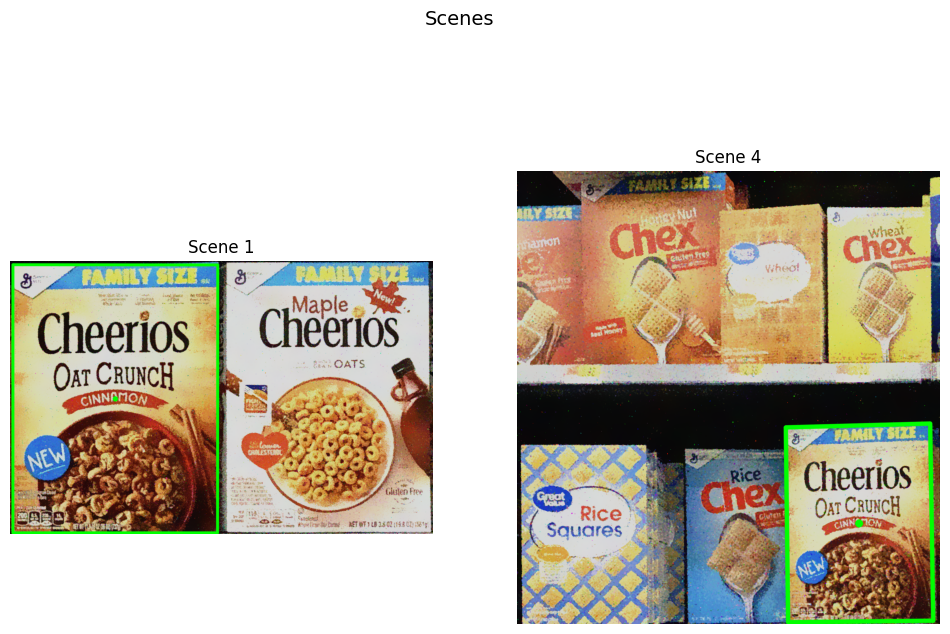

###################################################################################################
###################################### Detection of model: 2 ######################################


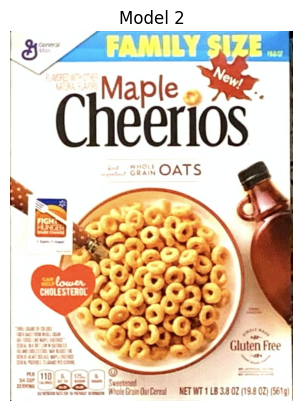

************************************************************************
************************************************************************
In scene 1:
    Position:  (1247.519, 533.316)
    Height:  1048.97
    Width:  802.43
************************************************************************
************************************************************************


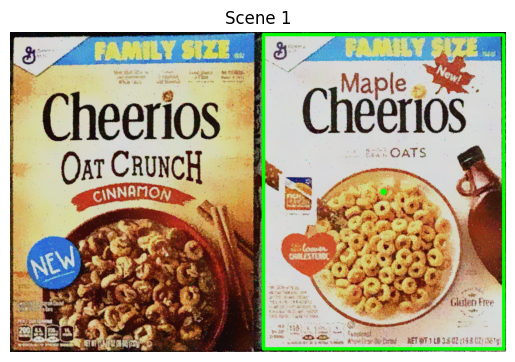

###################################################################################################
###################################### Detection of model: 3 ######################################


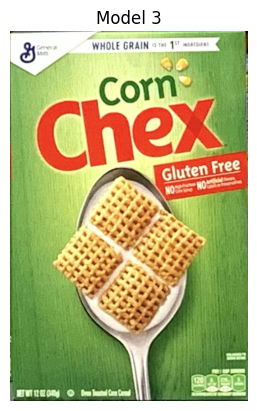

************************************************************************
************************************************************************
In scene 2:
    Position:  (305.661, 493.497)
    Height:  940.77
    Width:  603.94
************************************************************************
************************************************************************


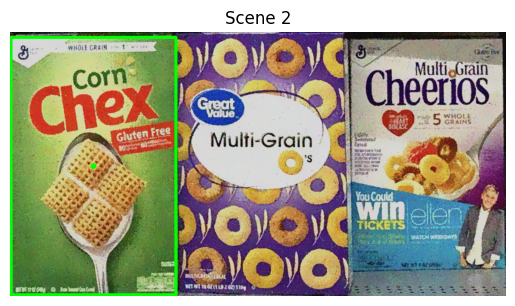

###################################################################################################
###################################### Detection of model: 4 ######################################


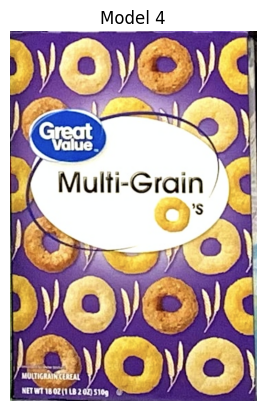

************************************************************************
************************************************************************
In scene 2:
    Position:  (927.544, 483.156)
    Height:  950.14
    Width:  633.17
************************************************************************
************************************************************************


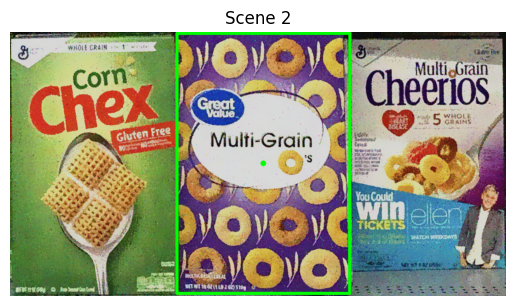

###################################################################################################
###################################### Detection of model: 5 ######################################


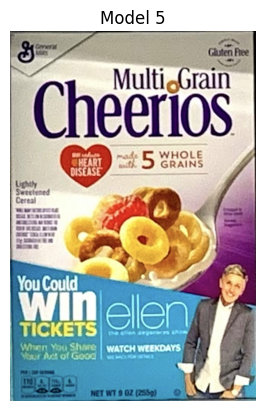

************************************************************************
************************************************************************
In scene 2:
    Position:  (1528.236, 450.276)
    Height:  844.06
    Width:  560.84
************************************************************************
************************************************************************


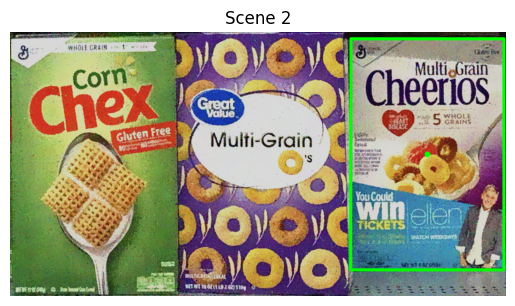

###################################################################################################
###################################### Detection of model: 6 ######################################


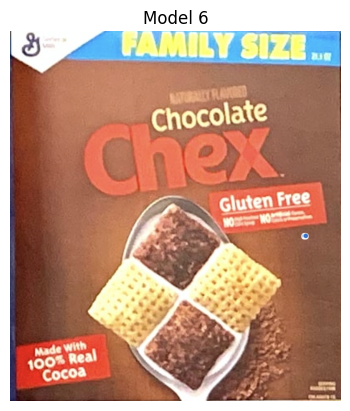

************************************************************************
************************************************************************
In scene 3:
    Position:  (298.739, 458.223)
    Height:  671.1
    Width:  601.53
************************************************************************
************************************************************************


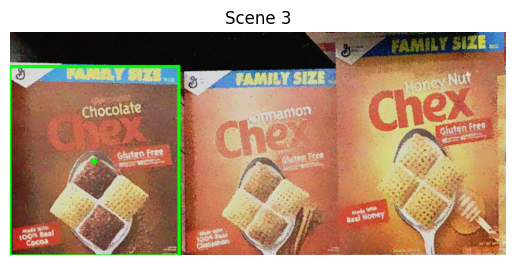

###################################################################################################
###################################### Detection of model: 7 ######################################


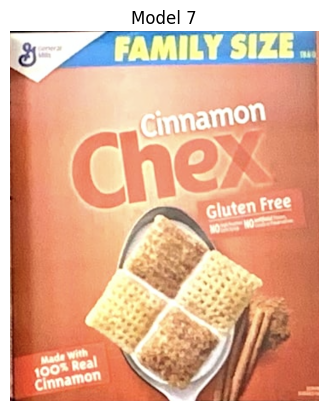

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  (888.697, 460.294)
    Height:  650.34
    Width:  542.54
************************************************************************
Found in the scene 4:
    Position:  (-4.935, 298.315)
    Height:  421.94
    Width:  350.12
************************************************************************
************************************************************************


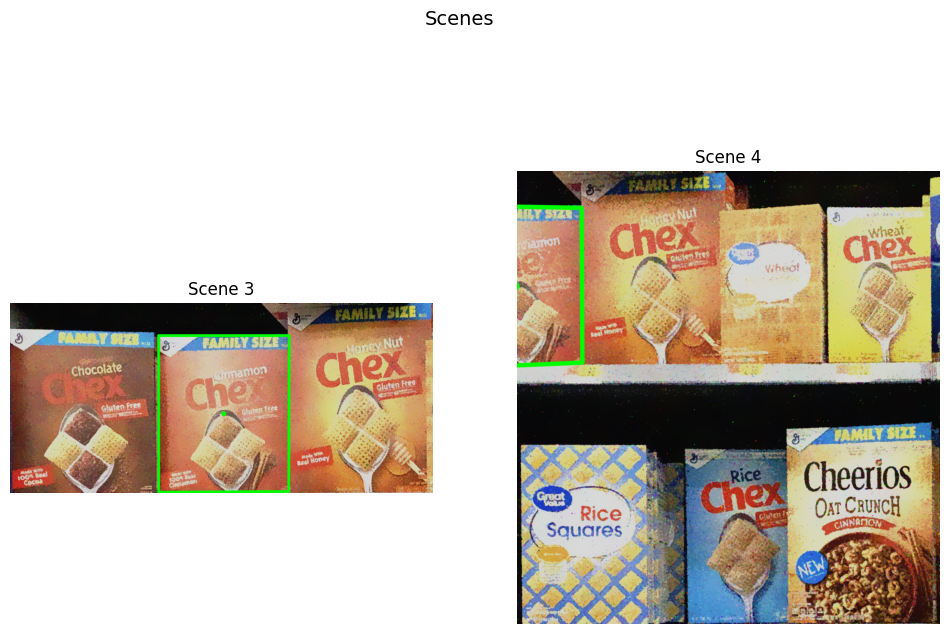

###################################################################################################
###################################### Detection of model: 8 ######################################


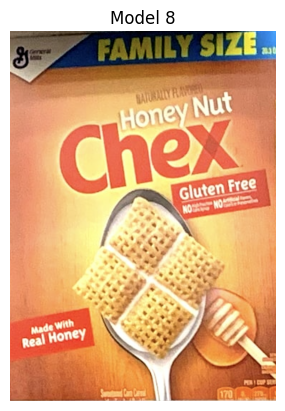

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  (1447.105, 398.513)
    Height:  779.89
    Width:  558.91
************************************************************************
Found in the scene 4:
    Position:  (349.588, 256.709)
    Height:  487.83
    Width:  349.66
************************************************************************
************************************************************************


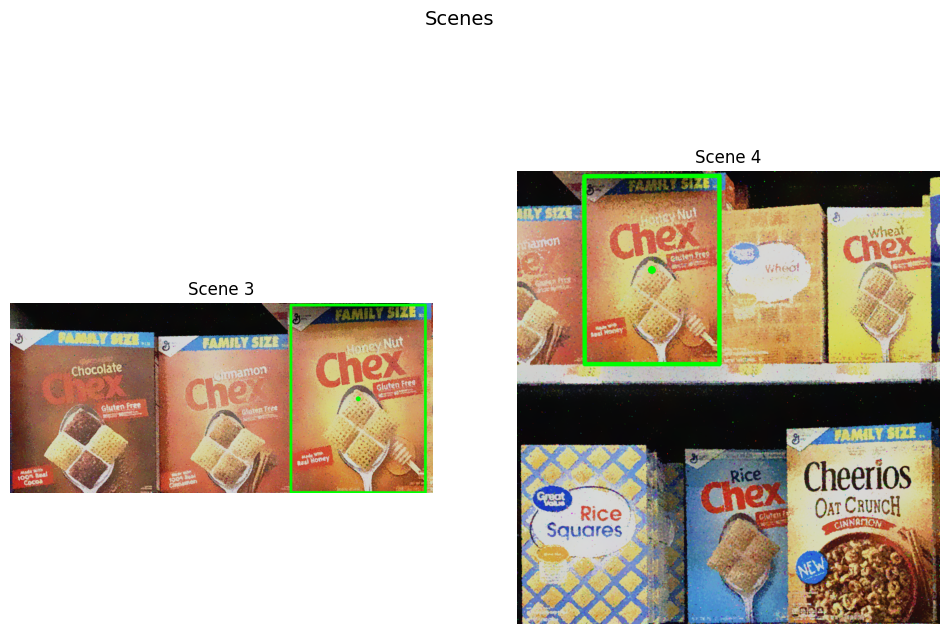

###################################################################################################
###################################### Detection of model: 9 ######################################


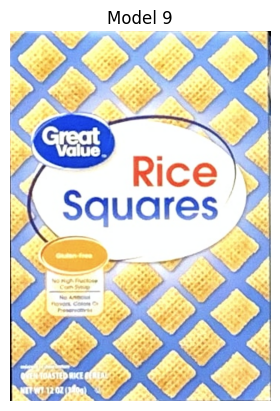

************************************************************************
************************************************************************
In scene 4:
    Position:  (174.475, 943.198)
    Height:  464.91
    Width:  328.52
************************************************************************
************************************************************************


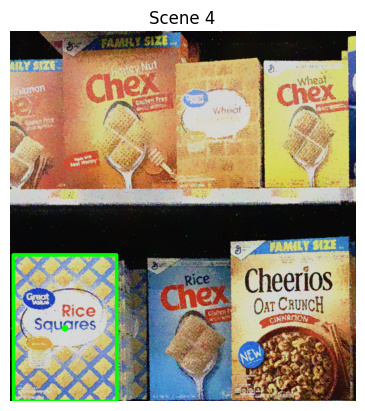

###################################################################################################
###################################### Detection of model: 10 ######################################


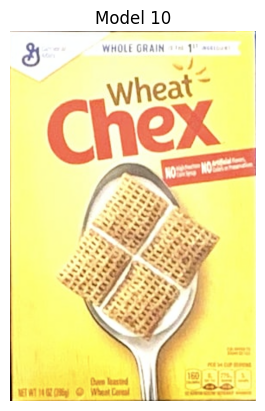

************************************************************************
************************************************************************
In scene 4:
    Position:  (941.818, 294.904)
    Height:  411.2
    Width:  268.37
************************************************************************
************************************************************************


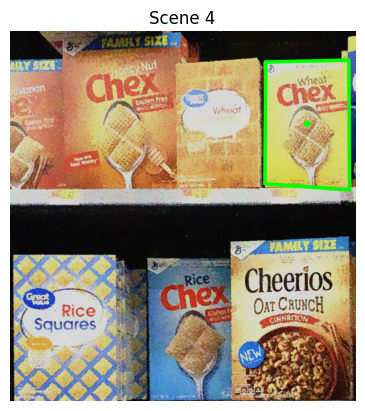

###################################################################################################
###################################### Detection of model: 11 ######################################


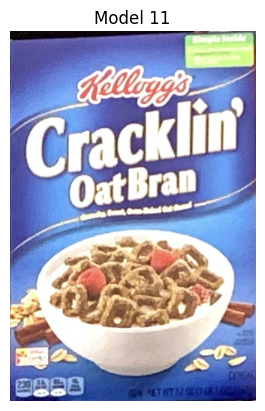

************************************************************************
************************************************************************
In scene 5:
    Position:  (368.525, 751.749)
    Height:  553.9
    Width:  367.41
************************************************************************
************************************************************************


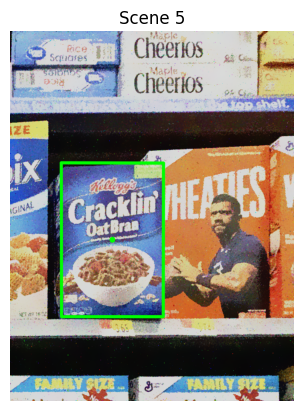

###################################################################################################
###################################### Detection of model: 12 ######################################


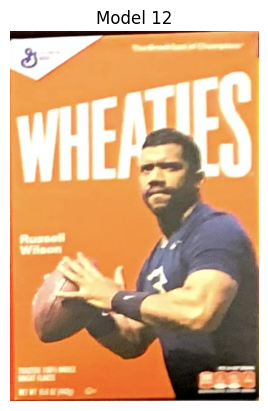

************************************************************************
************************************************************************
In scene 5:
    Position:  (714.085, 738.443)
    Height:  654.57
    Width:  439.64
************************************************************************
************************************************************************


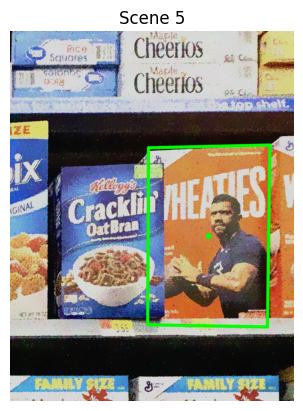

###################################################################################################
###################################### Detection of model: 13 ######################################


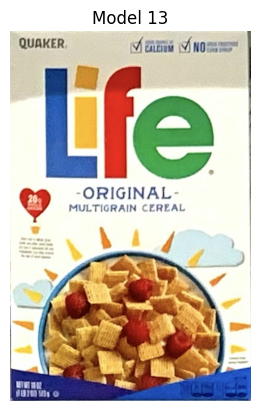

************************************************************************
Model not found!
************************************************************************
###################################################################################################
###################################### Detection of model: 14 ######################################


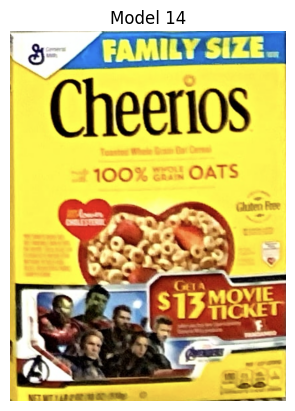

************************************************************************
Model not found!
************************************************************************


In [709]:
for i, model in enumerate(task_A_models):
    scenes_num = []
    boundingboxes = []
    centroids = []
    heights = []
    widths = []
    for j, scene in enumerate(task_A_scenes_denoised):
        result =  SIFT_templatematching_patch(model, scene, 0.015, 0.5, 8, 32)
        if result is not None:
            scenes_num.append(j)
            boundingboxes.append(result[0])
            centroids.append(result[1])
            heights.append(round(result[2], 2))
            widths.append(round(result[3], 2))
    plot_result(model, boundingboxes, centroids, heights, widths, i, scenes_num)

# Task B - Denoising

The process used to tune parameters for task A is repeated for task B.

### 1) Denoising by naked eye

In [598]:
scenes_path = 'dataset/scenes/'
models_path = 'dataset/models/'
scene_name = 'scene'
model_name = 'ref'

task_B_scenes = load_RGB_images(scenes_path, scene_name, 12)
task_B_models = load_RGB_images(models_path, model_name, 27)
task_B_scenes = task_B_scenes[5:]
task_B_models = task_B_models[14:]

In [542]:
task_B_scenes_denoised_naked_eye = []

for scene in task_B_scenes:
    median_denoised_scene = cv2.medianBlur(scene, 5)
    denoised_scene = cv2.bilateralFilter(median_denoised_scene, 40, 20, 90)
    task_B_scenes_denoised_naked_eye.append(denoised_scene)

### 2) Detection

In [551]:
model_idxs = [0, 1, 2, 5, 7, 2, 11] 
models_for_tuning = []

for idx in model_idxs:
    models_for_tuning.append(task_B_models[idx])  

In [552]:
sift = cv2.SIFT_create()
# List of homography matrices for mapping between each pair model - scene 
Ms = []
for i, (model, scene) in enumerate(zip(models_for_tuning, task_B_scenes_denoised_naked_eye)):
    model_kps, model_des = sift.detectAndCompute(model, None)
    scene_kps, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = remove_ambiguous_matches(matches)
    if is_detected(len(model_kps), len(filtered_matches), 0.015): # 2% of kps must be matched to consider the model detected in the scene
        Ms.append(get_homography(model_kps, scene_kps, filtered_matches))
    else:
        print(f"Missed detection for ref{model_idxs[i]+15}.png in scene{i+6}.png")

Let's plot the models and respective ROIs which will be used for tuning.

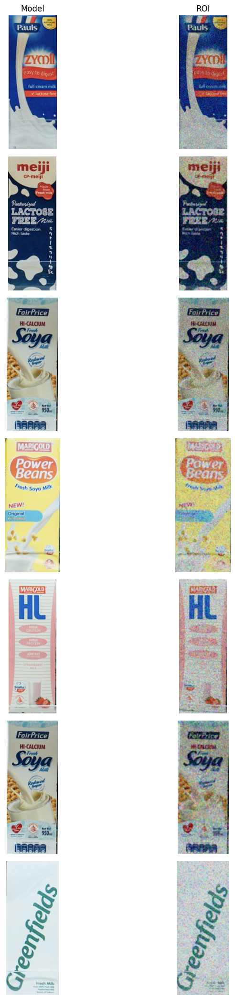

In [553]:
fig, axes = plt.subplots(len(models_for_tuning), 2, figsize=(10, len(models_for_tuning) * 3))
for i, (model, scene) in enumerate(zip(models_for_tuning, task_B_scenes_denoised_naked_eye)):
    
    roi = get_ROI_perspective_warped(model, scene, Ms[i])
    
    axes[i, 0].imshow(model)
    if i == 0:
        axes[i, 0].set_title('Model')
    axes[i, 0].axis('off')
   
    axes[i, 1].imshow(roi)
    if i == 0:
        axes[i, 1].set_title('ROI')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

### 3) Tuning **medianBlur** parameters

In [554]:
kernel = [3, 5, 7, 9, 11]
iterations = [1, 2, 4, 6, 8, 10]
sift = cv2.SIFT_create()

des_dists = []
pers = []

for iter in iterations:
    model_des_dists = []
    model_pers = []
    for i, model in enumerate(models_for_tuning):
        kp_model, des_model = sift.detectAndCompute(model, None)
        img = task_B_scenes[i]
        kernel_des_dists = []
        kernel_pers = []
        
        for val in kernel:
            for _ in range(iter):
                img = cv2.medianBlur(img, val)
            roi = get_ROI_perspective_warped(model, img, Ms[i])
            _, des_roi = sift.detectAndCompute(roi, None)
            matches = remove_ambiguous_matches(flann_knn_standard(des_model, des_roi))
            kernel_des_dists.append(compute_average_descriptor_distance(matches, des_model, des_roi))
            kernel_pers.append(len(matches)*100/len(kp_model))
            img = task_B_scenes[i]
    
        model_des_dists.append(kernel_des_dists)
        model_pers.append(kernel_pers)

    des_dists.append(model_des_dists)
    pers.append(model_pers)

In [559]:
flattened_des_dists = [item for sub1 in des_dists for sub2 in sub1 for item in sub2]
flattened_pers = [item for sub1 in pers for sub2 in sub1 for item in sub2]

# Z-score normalization
normalized_fattened_des_dists = normalize_z_score(flattened_des_dists)
# Invert values since we want to maximize the function value, in this way best result when distance is lower
normalized_fattened_des_dists = [-1 * item for item in normalized_fattened_des_dists]

normalized_flattened_pers = normalize_z_score(flattened_pers)
weig_des_dists_pers = [0.6 * x + 0.4 * y for x, y in zip(normalized_fattened_des_dists, normalized_flattened_pers)]

# Recreating sublists structure
weig_des_dists_pers = [weig_des_dists_pers[i:i + len(kernel)] for i in range(0, len(weig_des_dists_pers), len(kernel))]
normalized_des_dists = [normalized_fattened_des_dists[i:i + len(kernel)] for i in range(0, len(normalized_fattened_des_dists), len(kernel))]
normalized_pers = [normalized_flattened_pers[i:i + len(kernel)] for i in range(0, len(normalized_flattened_pers), len(kernel))]

weig_des_dists_pers = [weig_des_dists_pers[i:i + len(models_for_tuning)] for i in range(0, len(weig_des_dists_pers), len(models_for_tuning))]
normalized_des_dists = [normalized_des_dists[i:i + len(models_for_tuning)] for i in range(0, len(normalized_des_dists), len(models_for_tuning))]
normalized_pers = [normalized_pers[i:i + len(models_for_tuning)] for i in range(0, len(normalized_pers), len(models_for_tuning))]

In [568]:
means_des_dists = []
means_per = []
means_weig = []
colors = ['magenta', 'green', 'blue', 'purple', 'grey', 'orange', 'cyan']

for i in range(len(iterations)):
    mean_per = []
    mean_des_dist = []
    mean_weig = []
    
    for j in range(len(kernel)):
        sum_per = 0
        sum_des_dist = 0
        sum_weig = 0    
        
        for z in range(len(models_for_tuning)):
            sum_per += normalized_pers[i][z][j]
            sum_des_dist += normalized_des_dists[i][z][j]
            sum_weig += weig_des_dists_pers[i][z][j]
        
        mean_per.append(sum_per/len(models_for_tuning))
        mean_des_dist.append(sum_des_dist/len(models_for_tuning))
        mean_weig.append(sum_weig/len(models_for_tuning))
    
    means_per.append(mean_per)
    means_des_dists.append(mean_des_dist)

    means_weig.append(mean_weig)

*******************************************************
******************** 1 ITERATIONS ********************


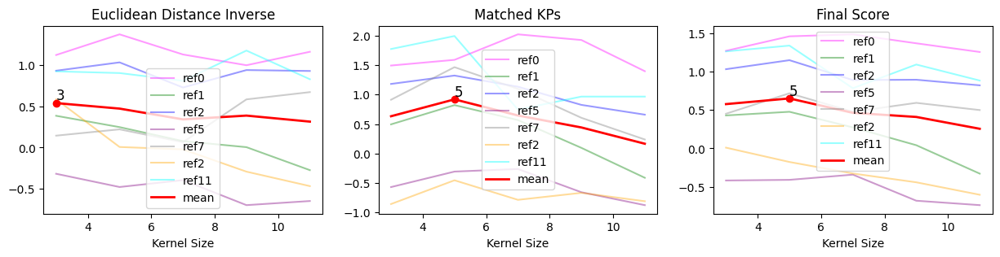

Best result with 1 iterations:
Kernel size: 5  |  Euc. Dist.: 0.47  |  %Kpts: 0.92  |  Func: 0.65

*******************************************************
******************** 2 ITERATIONS ********************


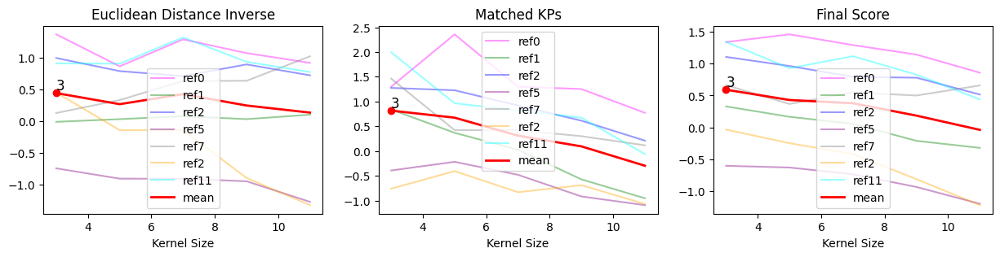

Best result with 2 iterations:
Kernel size: 3  |  Euc. Dist.: 0.44  |  %Kpts: 0.82  |  Func: 0.59

*******************************************************
******************** 4 ITERATIONS ********************


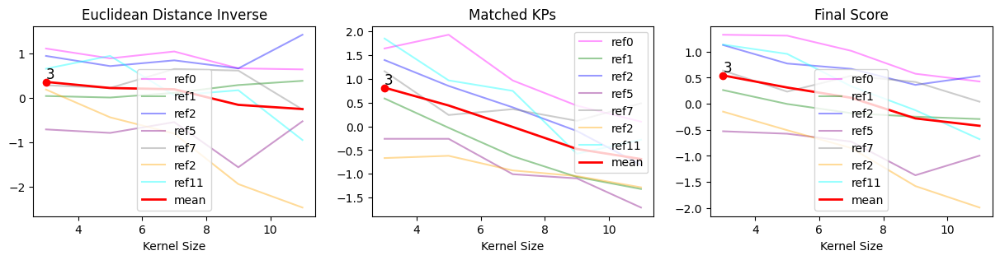

Best result with 4 iterations:
Kernel size: 3  |  Euc. Dist.: 0.37  |  %Kpts: 0.81  |  Func: 0.54

*******************************************************
******************** 6 ITERATIONS ********************


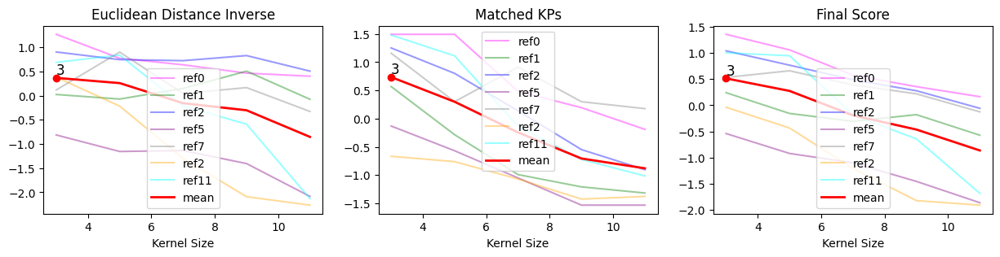

Best result with 6 iterations:
Kernel size: 3  |  Euc. Dist.: 0.37  |  %Kpts: 0.74  |  Func: 0.51

*******************************************************
******************** 8 ITERATIONS ********************


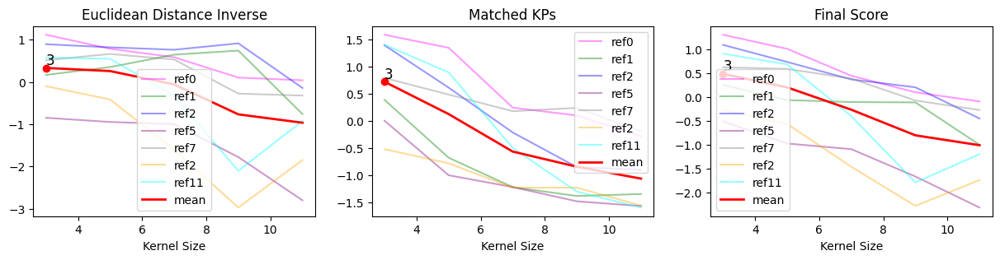

Best result with 8 iterations:
Kernel size: 3  |  Euc. Dist.: 0.33  |  %Kpts: 0.72  |  Func: 0.49

*******************************************************
******************** 10 ITERATIONS ********************


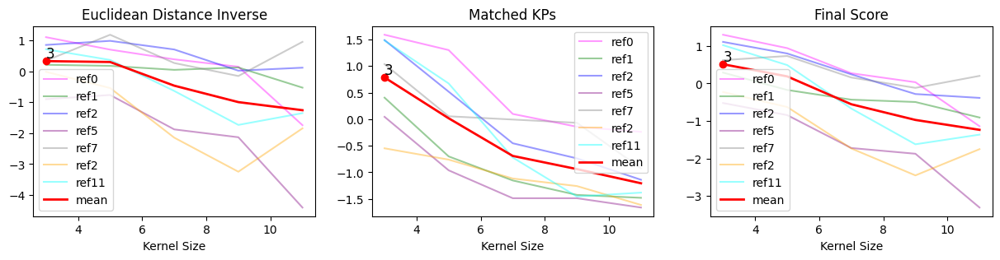

Best result with 10 iterations:
Kernel size: 3  |  Euc. Dist.: 0.33  |  %Kpts: 0.78  |  Func: 0.51



In [570]:
peaks_vals_weig = []
peaks_vals_des_dist = []
peaks_vals_pers = []

for i, iter in enumerate(iterations):
        print('*******************************************************')
        print(f'******************** {iter} ITERATIONS ********************')
        
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
        
        for j in range(len(models_for_tuning)):
            ax1.plot(kernel, normalized_des_dists[i][j], label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)
            ax2.plot(kernel, normalized_pers[i][j], label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)
            ax3.plot(kernel, weig_des_dists_pers[i][j],
                     label=f'ref{model_idxs[j]}', color=colors[j], alpha=0.4)        
        
        peak_idx_des_dist = means_des_dists[i].index(max(means_des_dists[i]))
        x_peak_des_dist = kernel[peak_idx_des_dist]
        y_peak_des_dist = means_des_dists[i][peak_idx_des_dist]
        
        peak_idx_per = means_per[i].index(max(means_per[i]))
        x_peak_per = kernel[peak_idx_per]
        y_peak_per = means_per[i][peak_idx_per]
        
        peak_idx_final = means_weig[i].index(max(means_weig[i]))
        x_peak_final = kernel[peak_idx_final]
        y_peak_final = means_weig[i][peak_idx_final]
        
        
        peaks_vals_weig.append((y_peak_final, x_peak_final))
        peaks_vals_des_dist.append((y_peak_des_dist, peak_idx_des_dist))
        peaks_vals_pers.append((y_peak_per, x_peak_per))
        
        ax1.plot(x_peak_des_dist, y_peak_des_dist, 'ro')
        ax1.text(x_peak_des_dist, y_peak_des_dist, f'{x_peak_des_dist}', fontsize=12, verticalalignment='bottom')
        ax1.plot(kernel, means_des_dists[i], color='red', label='mean', linewidth=2)
        ax1.set_title('Euclidean Distance Inverse')
        ax1.legend()
        
        ax2.plot(x_peak_per, y_peak_per, 'ro')
        ax2.text(x_peak_per, y_peak_per, f'{x_peak_per}', fontsize=12, verticalalignment='bottom')
        ax2.plot(kernel, means_per[i], color='red', label='mean', linewidth=2)
        ax2.set_title('Matched KPs')
        ax2.legend()
        
        ax3.plot(x_peak_final, y_peak_final, 'ro')
        ax3.text(x_peak_final, y_peak_final, f'{x_peak_final}', fontsize=12, verticalalignment='bottom')
        ax3.plot(kernel, means_weig[i], color='red', label='mean', linewidth=2)
        ax3.set_title('Final Score')
        ax3.legend()
        
        ax1.set_xlabel('Kernel Size')
        ax2.set_xlabel('Kernel Size')
        ax3.set_xlabel('Kernel Size')
        plt.show()
        
        best_res_idx = means_weig[i].index(max(means_weig[i]))
        print(f'Best result with {iter} iterations:')
        print(f'Kernel size: {kernel[best_res_idx]}  |  Euc. Dist.: {round(means_des_dists[i][best_res_idx],2)}  |  %Kpts: {round(means_per[i][best_res_idx],2)}  |  Func: {round(means_weig[i][best_res_idx],2)}')
        print('')

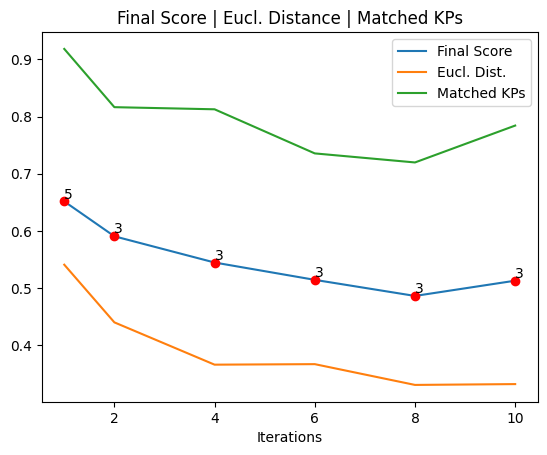

****************************************************************************************
****************************************************************************************
Iterations: 1  |  Kernel size: 5  |  Magnitude of function: 0.652
----------------------------------------------------------------------------------------
Iterations: 2  |  Kernel size: 3  |  Magnitude of function: 0.591
----------------------------------------------------------------------------------------
Iterations: 4  |  Kernel size: 3  |  Magnitude of function: 0.545
----------------------------------------------------------------------------------------
Iterations: 6  |  Kernel size: 3  |  Magnitude of function: 0.514
----------------------------------------------------------------------------------------
Iterations: 8  |  Kernel size: 3  |  Magnitude of function: 0.486
----------------------------------------------------------------------------------------
Iterations: 10  |  Kernel size: 3  |  Magnitude

In [571]:
plt.plot(iterations, [y for (y, _) in peaks_vals_weig], label='Final Score')
plt.plot(iterations, [y for (y, _) in peaks_vals_des_dist], label='Eucl. Dist.')
plt.plot(iterations, [y for (y, _) in peaks_vals_pers], label='Matched KPs')
plt.title('Final Score | Eucl. Distance | Matched KPs')

for i, peak in enumerate(peaks_vals_weig):
    plt.plot(iterations[i], peak[0], 'ro')
    plt.text(iterations[i], peak[0], f'{round(peak[1], 2)}', fontsize=10, verticalalignment='bottom')
    
plt.legend()
plt.xlabel('Iterations')
plt.show()

print('****************************************************************************************')
print('****************************************************************************************')
for i, iter in enumerate(iterations):   
    print(f'Iterations: {iter}  |  Kernel size: {peaks_vals_weig[i][1]}  |  Magnitude of function: {round(peaks_vals_weig[i][0],3)}')
    print('----------------------------------------------------------------------------------------')    
print('****************************************************************************************')
print('****************************************************************************************')

We get the best result with **kernel of size 5** and **1 iteration**.

### 4) Tuning **bilateralFilter** parameters

In [572]:
task_B_scenes_medianBlur = []
for scene in task_B_scenes:
    # 1 iterations with kernel of size 5
    task_B_scenes_medianBlur.append(cv2.medianBlur(scene, 5))

Let's try all the combinations of parameters for each scene and compute the Euclidean distance and percentage of matched keypoints for each one.

In [576]:
param_grid = {
    'd' : list(range(40, 70, 10)),
    'sigmaColor' : list(range(15, 35, 5)),
    'sigmaSpace' : list(range(15, 35, 5)),
    'iterations' : [1, 2, 3]
}

param_names = list(param_grid.keys())
# All possible combinations
combinations = list(itertools.product(*param_grid.values()))

des_dists = []
pers = []
    
for i, model in enumerate(models_for_tuning):
    kp_model, des_model = sift.detectAndCompute(model, None)

    for combination in combinations:
        params = dict(zip(param_names, combination))
        scene = task_B_scenes_medianBlur[i]
        for _ in range(params['iterations']):
            scene = cv2.bilateralFilter(scene, params['d'], params['sigmaColor'], params['sigmaSpace'])
        roi = get_ROI_perspective_warped(model, scene, Ms[i])
        _, des_roi = sift.detectAndCompute(roi, None)
        matches = remove_ambiguous_matches(flann_knn_standard(des_model, des_roi))
        des_dists.append(compute_average_descriptor_distance(matches, des_model, des_roi))
        pers.append(len(matches)*100/len(kp_model))

Let's normalize the results and invert the Euclidean distance. 

In [578]:
normalized_pers = normalize_z_score(pers)
normalized_des_dists = normalize_z_score(des_dists)
inv_normalized_des_dists = [item * -1 for item in normalized_des_dists]
# Collect values into a structured vocabulary for clarity and easier implementation in code
results = {key: {'Distance': [], 'Percentage': []} for key in combinations}
for i in range(len(models_for_tuning)):
    for j, comb in enumerate(combinations):
        idx = i * len(combinations) + j
        results[comb]['Distance'].append(normalized_pers[idx])
        results[comb]['Percentage'].append(inv_normalized_des_dists[idx])

Let's plot the results.

In [579]:
flattened_result = []
# Average on every model result for each combination + flattening into a list
for i, key in enumerate(combinations):
    des_dist_mean = np.mean(results[key]['Distance'])
    per_mean = np.mean(results[key]['Percentage'])
    weig_mean = np.mean(0.6 * des_dist_mean + 0.4 * per_mean)
    flattened_result.append([combinations[i][0], combinations[i][1], combinations[i][2], combinations[i][3], des_dist_mean, per_mean, weig_mean])

# Print results as Data Frame
df = pd.DataFrame(flattened_result, columns = param_names + ['Distance'] + ['Percentage'] + ['Final Score'])
styled_df = df.style.apply(highlight_max, subset = ['Distance', 'Percentage', 'Final Score'])
styled_df

,d,sigmaColor,sigmaSpace,iterations,Distance,Percentage,Final Score
0,40,15,15,1,-0.346918,-0.325382,-0.338304
1,40,15,15,2,-0.229791,-0.134811,-0.191799
2,40,15,15,3,-0.150881,0.030772,-0.078220
3,40,15,20,1,-0.385269,-0.197061,-0.309986
4,40,15,20,2,-0.214062,-0.081493,-0.161034
5,40,15,20,3,-0.138500,-0.020811,-0.091424
6,40,15,25,1,-0.398996,-0.207432,-0.322371
7,40,15,25,2,-0.189952,-0.075474,-0.144161
8,40,15,25,3,-0.059619,-0.013557,-0.041194
9,40,15,30,1,-0.415046,-0.203597,-0.330467


The best result is achieved with **3 iterations** and the following parameters:
-   **d** = 60	
-   **sigmaColor** = 25
-   **sigmaSpace** = 20	

# Task B - Detection

For task B, SIFT and similarity function will be used, as was done for task A. However, since we need to detect multiple instances of each object in each scene, and since SIFT + ZNCC might not be accurate enough, some new methods have been introduced.

Let's first denoise all the scenes using the parameters found.

In [580]:
task_B_scenes_denoised = []
for scene in task_B_scenes:
    task_B_scenes_denoised.append(cv2.bilateralFilter(cv2.bilateralFilter(cv2.bilateralFilter(cv2.medianBlur(scene, 5), 60, 25, 20), 60, 25, 20), 60, 25, 20))

In [695]:
def plot_result_B(model, boundingboxes, centroids, heights, widths, model_num, scenes_num):
    '''
    Plots the detection for task B of the results of a model in multiple scenes and prints relevant information.

    Parameters:
        model: The image of the model being detected.
        boundingboxes: A list of bounding box images where the model was detected in different scenes.
        centroids: A list of (x, y) coordinates representing the centroids of the detected bounding boxes.
        heights: Heights of the detected bounding boxes.
        widths: Widths of the detected bounding boxes.
        model_num: The index of the model being processed.
        scenes_num: Indices of the scenes where the model was detected. 
        
    Returns:
        None
    '''
    
    print('###################################################################################################')
    print(f'###################################### Detection of model: {model_num+1} ######################################')
    # Check if gray image and plot model
    if len(model.shape)==3:
        plt.imshow(model)
    else:
        plt.imshow(model, cmap='gray')
    plt.title(f'Model {model_num+1}')
    plt.axis('off')
    plt.show()
    
    if len(boundingboxes) > 0:
        print('************************************************************************')
        if len(boundingboxes) == 1:
            print('************************************************************************')
            print(f'In scene {scenes_num[0]+1}:')
            print('    Position: ', centroids[0])
            print('    Height: ', [float(v) for v in heights[0]])
            print('    Width: ', [float(v) for v in widths[0]])
            print('************************************************************************')
            print('************************************************************************')
            plt.imshow(boundingboxes[0])
            plt.title(f'Scene {scenes_num[0]+1}')
            plt.axis('off')
            plt.show()
        else:
            if len(boundingboxes) == 2:
                rows = 1
                cols = 2
            else:
                rows = math.ceil(math.sqrt(len(boundingboxes)))
                cols = math.ceil(len(boundingboxes) / rows)
                
            fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
        
            fig.suptitle(f'Scenes', fontsize=14)
                
            for i in range(1, cols):
                axes.flat[i].axis('off')    
                
            for i in range(rows):
                for j in range(cols):
                    scene_idx = i * cols + j
                    ax_idx = i * cols + j
                    if scene_idx < len(boundingboxes):
                        # Check if gray image
                        if len(model.shape) == 3:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx])
                        else:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx], cmap='gray')
                        axes.flat[ax_idx].set_title(f'Scene {scenes_num[scene_idx]+1}')
                        axes.flat[ax_idx].axis('off')
                        print('************************************************************************')
                        print(f'Found in the scene {scenes_num[scene_idx]+1}:')
                        print('In the following positions: ')
                        print('    Position: ', centroids[scene_idx])
                        print('    Height: ', [float(v) for v in heights[scene_idx]])
                        print('    Width: ', [float(v) for v in widths[scene_idx]])
                    else:
                        axes.flat[ax_idx].axis('off')
            #plt.tight_layout()
            print('************************************************************************')
            print('************************************************************************')
            plt.show()
            
    else:
        print('************************************************************************')
        print('Model not found!')
        print('************************************************************************')

In order to find all the multiple instances of each model in each scene, we need a function that, once an instance is found, takes the scene and the corners, removes the area of parallelogram where there is the detected object in the scene. In this way we can ensures that, in the next iteration, the same object won't be found again. However, if another instance of the object exists in the scene, it will detect that one instead.

In [660]:
def remove_pixels_in_parallelogram(scene, parallelogram):
    """
    Sets all pixel values inside the parallelogram to black in the given image.

    Parameters:
        scene: the input image.
        parallelogram: representing the (x, y) coordinates of the vertices of the parallelogram.

    Returns:
        scene_with_hole: The modified image with the pixels inside the parallelogram set to black.
    """

    mask = np.zeros(scene.shape[:2], dtype=np.uint8)

    poly = np.array(parallelogram, dtype=np.int32).reshape((-1, 1, 2))
    
    cv2.fillPoly(mask, [poly], 255)

    if len(scene.shape) == 3:  
        scene[mask == 255] = [0, 0, 0]
    else:  
        scene[mask == 255] = 0

    return scene

def get_transformed_corners(model, M):
    """
    Computes the transformed corners of a model using a perspective transformation matrix.

    Parameters:
    - model: The input image .
    - M: A 3x3 perspective transformation matrix.

    Returns:
    - trans_corners: Transformed coordinates of the four corners of the model after applying the perspective transformation.
    """
    if len(model.shape) == 3:
        h,w, _ = model.shape
    else: 
        h,w = model.shape
    
    model_corners = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(model_corners,M)
    return trans_corners

A new method to double-check the detection of SIFT has been introduced, as ZNCC alone is not sufficient. The functions **calcHist** and **compareHist** from the OpenCV library are used to compute histograms in the HSV color space and compare their distributions. The HSV space is chosen because it represents color more effectively. We focus only on the Hue channel which represent the type of the color, as this decision helps distinguish between many similar objects with different colors. By adding this third check, we aim to avoid incorrect detections that ZNCC cannot filter out. An example is provided with a couple of models and ROI computed during the denoising step.

In [674]:
def color_check_plot(model, roi, plot=False):
    """
    Compares the color distribution of model and ROI in the HSV color space 
    using histograms and optionally plots the histograms for visualization.

    Parameters:
    - model: The model image to compare.
    - roi: The region of interest (ROI) image to compare against the model.
    - plot: If True, plots the Hue, Saturation, and Value histograms for 
            both the model and ROI images.

    Returns:
    - similarity_H: Represent the similarity of the Hue channel histograms between the model 
                    and ROI, computed using the correlation method.
    """
    
    # From RGB to HSV color space
    model_hsv = cv2.cvtColor(model, cv2.COLOR_RGB2HSV)
    roi_hsv = cv2.cvtColor(roi, cv2.COLOR_RGB2HSV)
    
    # Calculate histograms
    hist1_H = cv2.calcHist([model_hsv], [0], None, [256], [0, 256])
    hist2_H = cv2.calcHist([roi_hsv], [0], None, [256], [0, 256])
    
    hist1_S = cv2.calcHist([model_hsv], [1], None, [256], [0, 256])
    hist2_S = cv2.calcHist([roi_hsv], [1], None, [256], [0, 256])
    
    hist1_V = cv2.calcHist([model_hsv], [2], None, [256], [0, 256])
    hist2_V = cv2.calcHist([roi_hsv], [2], None, [256], [0, 256])
    
    # Compare histogram on channel H for similarity
    similarity_H = cv2.compareHist(hist1_H, hist2_H, cv2.HISTCMP_CORREL)
    similarity_S = cv2.compareHist(hist1_S, hist2_S, cv2.HISTCMP_CORREL)
    similarity_V = cv2.compareHist(hist1_V, hist2_V, cv2.HISTCMP_CORREL)
    
    if plot == True:
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Hue Histograms')
        plt.plot(hist1_H, color='r', label='Model')
        plt.plot(hist2_H, color='b', label='ROI')
        plt.xlim([0, 256])
        plt.legend()
        
        plt.subplot(1, 3, 2)
        plt.title('Saturation Histograms')
        plt.plot(hist1_S, color='r', label='Model')
        plt.plot(hist2_S, color='b', label='ROI')
        plt.xlim([0, 256])
        plt.legend()

        plt.subplot(1, 3, 3)
        plt.title('Value Histograms')
        plt.plot(hist1_V, color='r', label='Model')
        plt.plot(hist2_V, color='b', label='ROI')
        plt.xlim([0, 256])
        plt.legend()

        plt.tight_layout()
        plt.show()

    return similarity_H

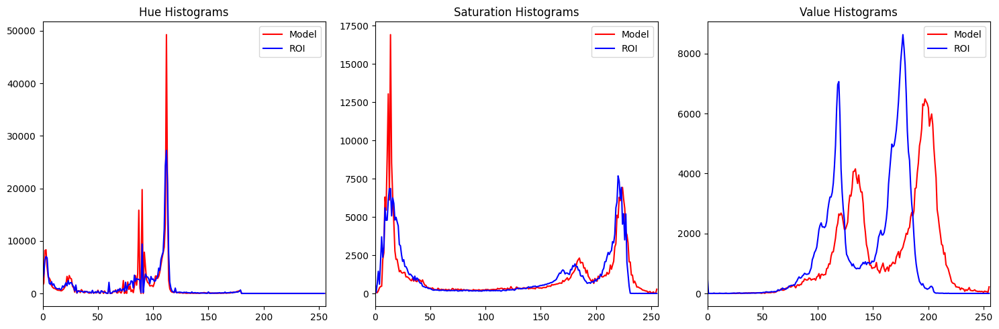

Similarity:  0.86


In [675]:
model_example = task_B_models[0]
scene_example = task_B_scenes_denoised[0]
roi_example = get_ROI_perspective_warped(model, scene_example, Ms[0]) 
val = color_check_plot(model_example, roi_example, True)

print('Similarity: ', round(val,2))

We now need to define a function that, given the model and the scene, searches for all instances of the model present in the scene. As previously mentioned, color histogram comparison is introduced as a new criterion to filter out incorrect matches, in addition to ZNCC. A new threshold, the color_th threshold, is required.

If an instance was found in the previous iteration, the new scene will be the same as the previous one, except for the area where the first instance was found. That area will be replaced with black pixels, and SIFT will be applied again to search for the next instance.

In [698]:
def multiple_object_detection_removing(model, scene, th, temp_th, color_th):
    """
    Detects multiple instances of a model in a scene, removes detected objects from the scene, 
    and returns the updated scene with bounding boxes, centroids, and object dimensions.

    The function iterates through the scene to find instances of the model, using SIFT to detect keypoints, 
    and performs ZNCC similarity and color histogram comparison to validate detections. Once an instance is detected, 
    it removes the region of the detected object from the scene to allow detection of the next instance.

    Parameters:
    - model: The model image to be detected in the scene.
    - scene: The scene image in which the model instances are being searched.
    - th: A threshold value used to determine if the number of matches between keypoints is sufficient.
    - temp_th: A threshold value for template matching to confirm a valid detection.
    - color_th: A threshold value for the color histogram comparison to validate the detection.

    Returns:
    - tuple: A tuple containing:
        - Updated scene with removed instances (bounding box regions),
        - List of centroids (positions) of detected objects,
        - List of heights of the detected objects,
        - List of widths of the detected objects.
    - None: If no instances are detected in the scene.
    """
    centroids = []
    heights = []
    widths = []
    more_instances = True
    scene_with_holes = scene.copy()
    boundingbox_scene = scene.copy()
    
    while more_instances:
        model_kp, model_des = sift.detectAndCompute(model, None)
        scene_kp, scene_des = sift.detectAndCompute(scene_with_holes, None)
        matches = remove_ambiguous_matches(flann_knn_standard(model_des, scene_des))
        if len(matches) > 4 and is_detected(len(model_kp), len(matches), th):
            M = get_homography(model_kp, scene_kp, matches)
            if M is None: 
                more_instances = False
                continue
            roi = get_ROI_perspective_warped(model, scene, M)
            color = color_check_plot(model, roi)
            tmpl_match = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
            
            # Template Matching and Color Hist Check
            if color >= color_th and tmpl_match >= temp_th:
                corners = get_transformed_corners(model, M)
                scene_with_holes = remove_pixels_in_parallelogram(scene_with_holes, corners)
                boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, boundingbox_scene, M)
                centroids.append(centroid_position)
                heights.append(height)
                widths.append(width)
            else:
                more_instances = False
        else:
            more_instances = False
    if len(centroids) > 0:
        return (boundingbox_scene, centroids, heights, widths)
    else: 
        return None

Let's now iterate the search for each model over every scene.

###################################################################################################
###################################### Detection of model: 1 ######################################


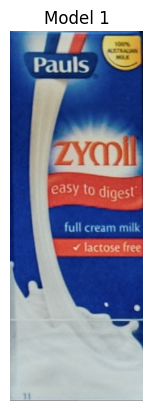

************************************************************************
************************************************************************
In scene 1:
    Position:  [(582.906, 620.284), (188.39, 615.236)]
    Height:  [905.4, 907.15]
    Width:  [324.06, 339.83]
************************************************************************
************************************************************************


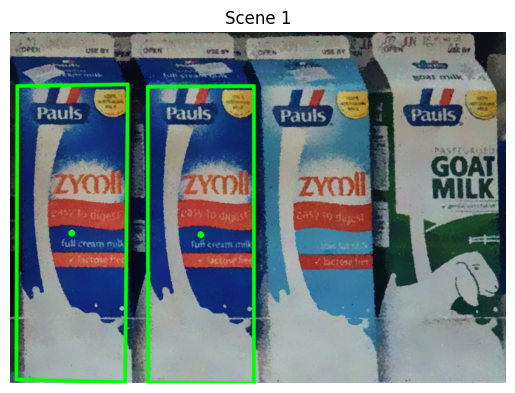

###################################################################################################
###################################### Detection of model: 2 ######################################


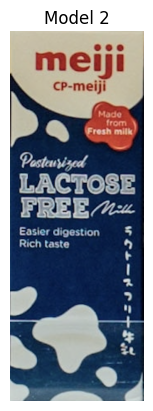

************************************************************************
************************************************************************
In scene 2:
    Position:  [(794.948, 461.222), (1030.127, 461.759)]
    Height:  [600.21, 603.24]
    Width:  [217.44, 228.21]
************************************************************************
************************************************************************


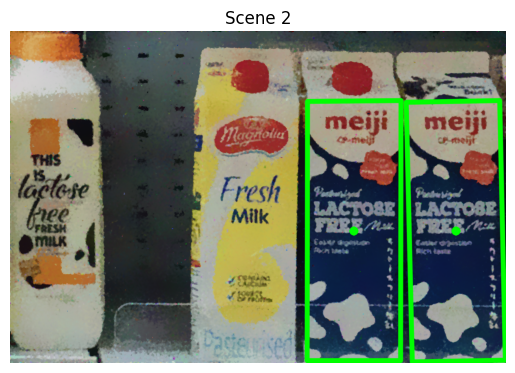

###################################################################################################
###################################### Detection of model: 3 ######################################


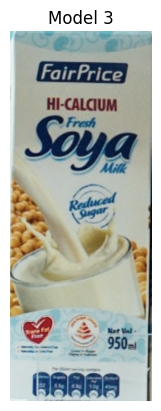

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  [(648.686, 568.702), (988.788, 575.565)]
    Height:  [853.66, 853.08]
    Width:  [324.59, 328.56]
************************************************************************
Found in the scene 6:
    Position:  [(166.728, 361.944), (358.371, 365.476)]
    Height:  [481.42, 480.92]
    Width:  [184.2, 186.15]
************************************************************************
************************************************************************


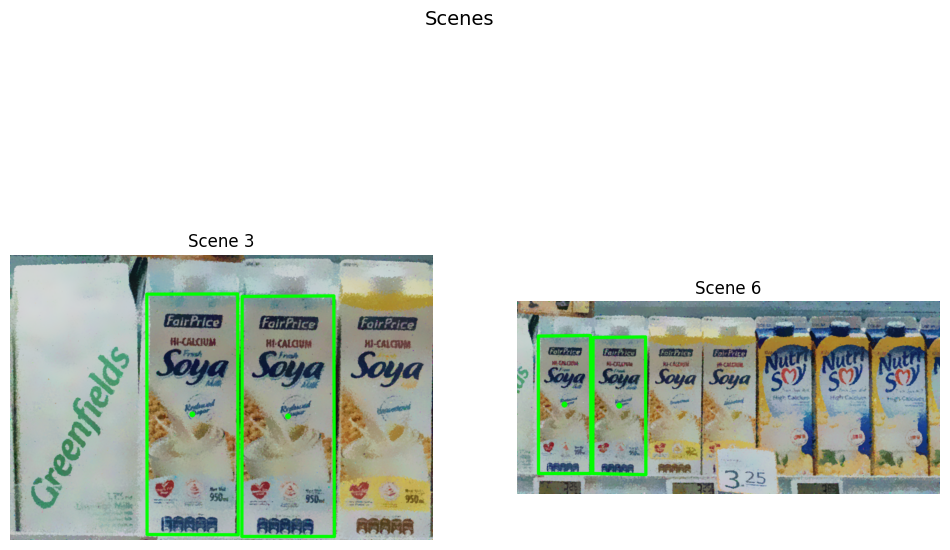

###################################################################################################
###################################### Detection of model: 4 ######################################


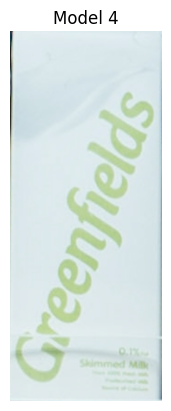

************************************************************************
Model not found!
************************************************************************
###################################################################################################
###################################### Detection of model: 5 ######################################


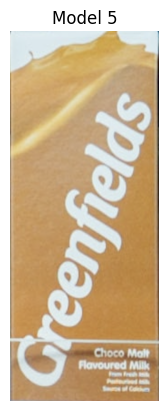

************************************************************************
************************************************************************
In scene 4:
    Position:  [(849.298, 374.915), (618.978, 371.93)]
    Height:  [566.75, 561.76]
    Width:  [226.25, 227.5]
************************************************************************
************************************************************************


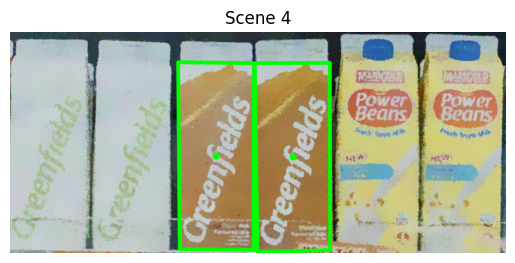

###################################################################################################
###################################### Detection of model: 6 ######################################


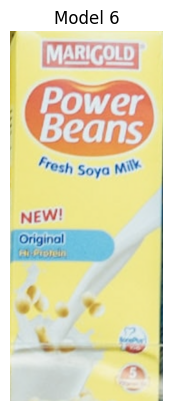

************************************************************************
************************************************************************
In scene 4:
    Position:  [(1361.364, 377.544), (1107.716, 375.292)]
    Height:  [556.72, 556.46]
    Width:  [230.77, 239.69]
************************************************************************
************************************************************************


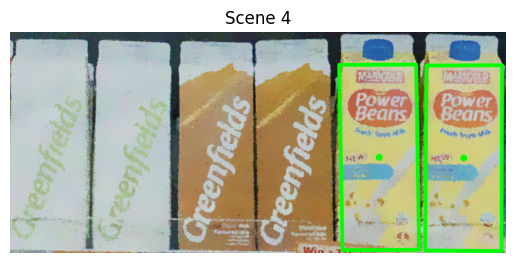

###################################################################################################
###################################### Detection of model: 7 ######################################


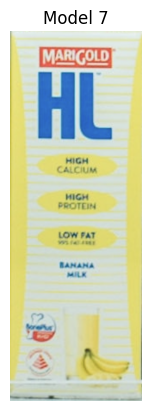

************************************************************************
************************************************************************
In scene 5:
    Position:  [(711.395, 535.587), (982.977, 537.344)]
    Height:  [700.23, 697.98]
    Width:  [245.02, 248.17]
************************************************************************
************************************************************************


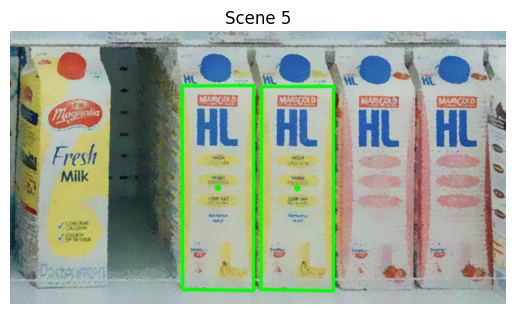

###################################################################################################
###################################### Detection of model: 8 ######################################


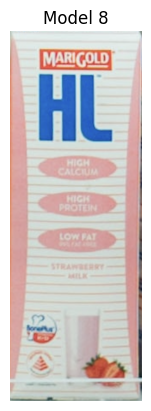

************************************************************************
************************************************************************
In scene 5:
    Position:  [(1263.505, 534.453), (1528.571, 533.923)]
    Height:  [700.39, 696.33]
    Width:  [241.11, 250.9]
************************************************************************
************************************************************************


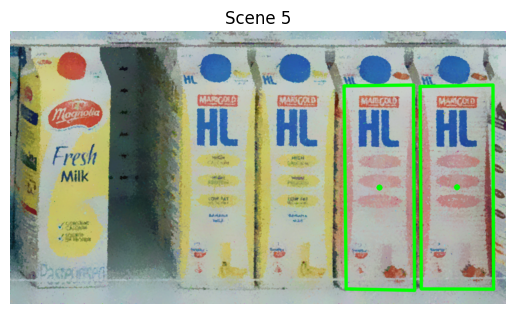

###################################################################################################
###################################### Detection of model: 9 ######################################


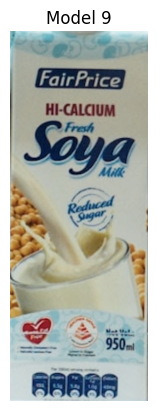

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  [(987.33, 566.997), (647.612, 559.91)]
    Height:  [871.45, 871.24]
    Width:  [321.69, 320.19]
************************************************************************
Found in the scene 6:
    Position:  [(356.205, 362.314), (165.873, 357.445)]
    Height:  [490.71, 492.31]
    Width:  [182.0, 180.49]
************************************************************************
************************************************************************


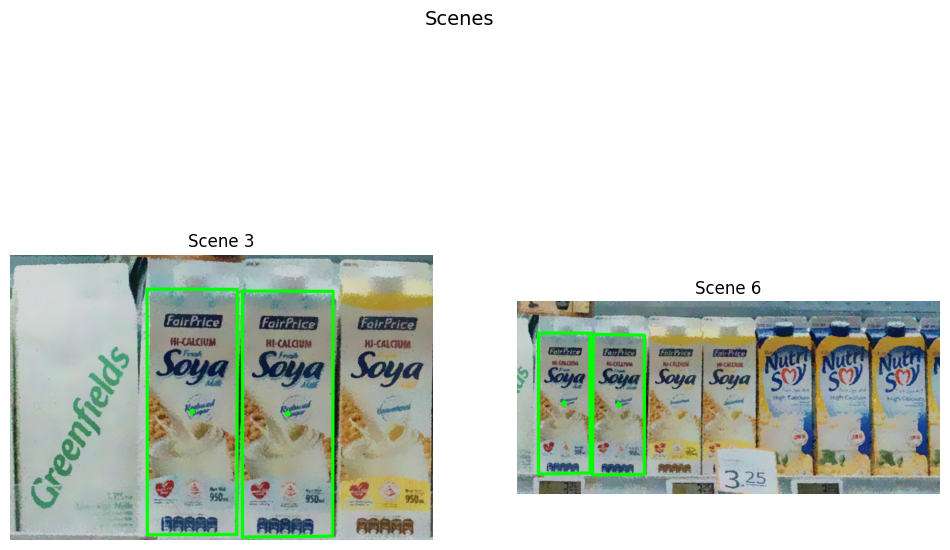

###################################################################################################
###################################### Detection of model: 10 ######################################


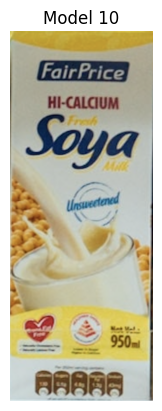

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  [(1337.768, 579.644)]
    Height:  [853.35]
    Width:  [327.59]
************************************************************************
Found in the scene 6:
    Position:  [(555.482, 368.354), (746.117, 373.361)]
    Height:  [483.91, 490.45]
    Width:  [187.59, 190.26]
************************************************************************
************************************************************************


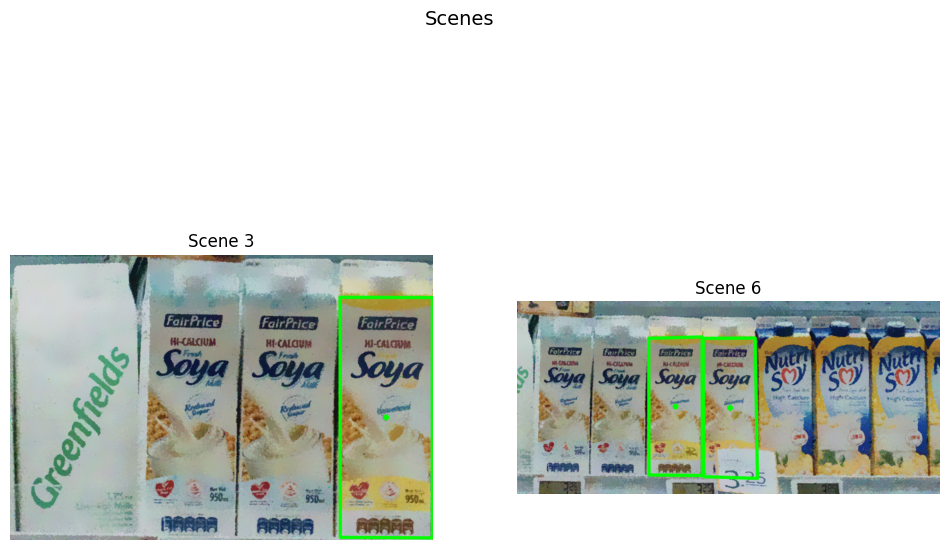

###################################################################################################
###################################### Detection of model: 11 ######################################


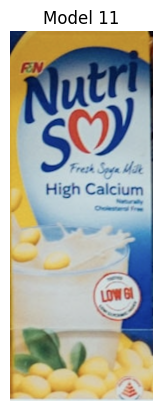

************************************************************************
************************************************************************
In scene 6:
    Position:  [(1344.156, 374.776), (943.711, 367.526), (1143.175, 371.316)]
    Height:  [484.32, 479.07, 483.23]
    Width:  [185.95, 187.83, 186.83]
************************************************************************
************************************************************************


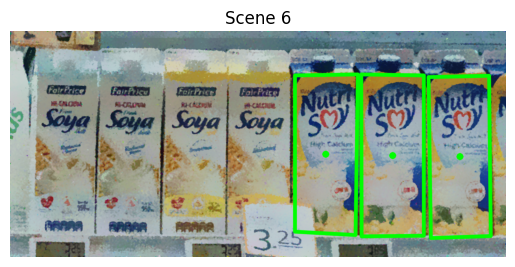

###################################################################################################
###################################### Detection of model: 12 ######################################


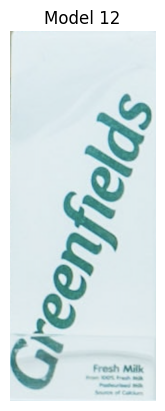

************************************************************************
Model not found!
************************************************************************
###################################################################################################
###################################### Detection of model: 13 ######################################


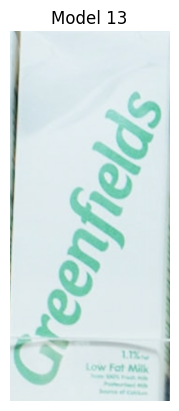

************************************************************************
Model not found!
************************************************************************


In [710]:
for i, model in enumerate(task_B_models):
    scenes_num = []
    boundingboxes = []
    centroids = []
    heights = []
    widths = []
    for j, scene in enumerate(task_B_scenes_denoised):
        result = multiple_object_detection_removing(model, scene, 0.01, 0.6, 0.68)
        if result is not None:
            scenes_num.append(j)
            boundingboxes.append(result[0])
            centroids.append(result[1])
            heights.append([round(float(v),2) for v in result[2]])
            widths.append([round(float(v),2) for v in result[3]])
    plot_result(model, boundingboxes, centroids, heights, widths, i, scenes_num)

The combination of **SIFT**, **ZNCC**, and **Color Histogram** successfully detects all the models except for the Greenfields milk boxes. It is possible to detect the two darker versions by lowering the thresholds for template matching and color histogram. However, this would introduce errors in the detection of other models. As for the lighter version, SIFT is unable to detect it with the current level of denoising.